In [59]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import re
import textwrap
import matplotlib.patches as mpatches

# ==========================================
# 1. HELPER FUNCTIONS (The Engine)
# ==========================================

def load_google_sheet(sheet_url):
    """Parses URL and fetches CSV from Google Sheets."""
    id_match = re.search(r'/d/([a-zA-Z0-9-_]+)', sheet_url)
    if not id_match: raise ValueError("Invalid Google Sheets URL.")
    sheet_id = id_match.group(1)
    
    gid_match = re.search(r'gid=([0-9]+)', sheet_url)
    gid = gid_match.group(1) if gid_match else '0'
    
    print(f"Fetching data from Sheet ID: {sheet_id}...")
    return pd.read_csv(f'https://docs.google.com/spreadsheets/d/{sheet_id}/export?format=csv&gid={gid}')

def clean_band_data(df):
    """Detects voters, maps scores, handles vetoes, and cleans garbage rows."""
    clean = df.copy()
    
    # Stop at first blank row
    if clean.iloc[:, 0].isnull().any():
        clean = clean.loc[:clean.iloc[:, 0].isnull().idxmax()-1]
    
    # Song Name Normalization
    if 'Artist' in clean.columns and 'Song' in clean.columns:
        clean['Song_Display'] = clean['Artist'].astype(str) + " - " + clean['Song'].astype(str)
    elif 'Song' in clean.columns:
        clean['Song_Display'] = clean['Song'].astype(str)
    else:
        clean['Song_Display'] = clean.iloc[:, 0].astype(str)

    # Smart Column Detection (Excludes Metadata)
    meta_keys = ['Song', 'Artist', 'BPM', 'Genre', 'Link', 'Spotify', 'Notes', 'Key', 'Score', 'Count', 'Vote']
    voter_cols = [c for c in clean.columns if not any(k in c for k in meta_keys) and c != 'Song_Display']
    
    # Score Map
    score_map = {'Yes': 2, 'yes': 2, '2': 2, 2: 2, 'Maybe': 1, 'maybe': 1, '1': 1, 1: 1, 
                 'No': -1, 'no': -1, '0': -1, 0: -1, '': 0, np.nan: 0}
    
    for col in voter_cols:
        clean[col] = clean[col].map(score_map).fillna(0)
        
    # Veto Logic
    clean = clean[~clean[voter_cols].isin([-1]).any(axis=1)]
    return clean, voter_cols

def solve_schulze(df, voter_cols):
    """Calculates the Schulze Beatpath Matrix using Margins."""
    songs = df['Song_Display'].tolist()
    n = len(songs)
    votes = df[voter_cols].values 
    d, p = np.zeros((n, n)), np.zeros((n, n))
    
    # 1. Margins
    for i in range(n):
        for j in range(n):
            if i != j:
                d[i, j] = np.sum(votes[i] > votes[j]) - np.sum(votes[j] > votes[i])

    # 2. Paths
    for i in range(n):
        for j in range(n):
            if i != j and d[i, j] > d[j, i]: p[i, j] = d[i, j]

    # 3. Floyd-Warshall
    for k in range(n):
        for i in range(n):
            for j in range(n):
                if i != j and i != k and j != k:
                    p[i, j] = max(p[i, j], min(p[i, k], p[k, j]))
    return songs, p

def print_setlist(songs, p_matrix):
    """Prints the final ranked list to text output."""
    n = len(songs)
    wins = np.zeros(n)
    for i in range(n):
        for j in range(n):
            if i != j and p_matrix[i, j] > p_matrix[j, i]: wins[i] += 1
    
    ranked_indices = np.argsort(wins)[::-1]
    print("\n" + "="*40 + f"\nTHE FINAL SETLIST (Top {len(songs)})\n" + "="*40)
    for rank, idx in enumerate(ranked_indices):
        print(f"{rank+1}. {songs[idx]}")
    return ranked_indices

def visualize_network(songs, p_matrix):
    """Draws the Node Graph with Source-Coloring and Tapered Arrows."""
    G = nx.DiGraph()
    n = len(songs)
    max_w = np.max(p_matrix) if np.max(p_matrix) > 0 else 1
    
    def smart_label(name):
        if '-' in name: name = name.split('-')[0].strip()
        return "\n".join(textwrap.wrap(name, width=12))

    # Build Graph
    for i in range(n):
        for j in range(n):
            if i != j and p_matrix[i, j] > p_matrix[j, i]:
                G.add_edge(smart_label(songs[i]), smart_label(songs[j]), weight=p_matrix[i, j])

    plt.figure(figsize=(18, 16)) # Bigger canvas
    pos = nx.spring_layout(G, k=6, iterations=100, seed=42) 
    
    # --- COLOR MAGIC ---
    # Assign a unique color to every node from a pastel palette
    # Using 'husl' ensures distinct, evenly spaced colors
    palette = sns.color_palette("husl", len(G.nodes()))
    color_map = {node: palette[i] for i, node in enumerate(G.nodes())}
    node_colors = [color_map[n] for n in G.nodes()]

    # Draw Nodes
    nx.draw_networkx_nodes(G, pos, node_size=3800, node_color=node_colors, edgecolors='black', alpha=0.9)
    nx.draw_networkx_labels(G, pos, font_size=8, font_weight='bold', font_color='black')
    
    # Draw Edges (Source-Colored)
    edges = G.edges()
    if len(edges) > 0:
        weights = [G[u][v]['weight'] for u,v in edges]
        # Match edge color to the SOURCE node
        edge_colors = [color_map[u] for u,v in edges]
        
        # Calculate Alphas (Opacity) based on strength
        # Weak wins = transparent, Strong wins = solid
        alphas = [(w / max_w)*0.6 + 0.2 for w in weights]
        
        # Draw each edge individually to control color/alpha
        for i, (u, v) in enumerate(edges):
            nx.draw_networkx_edges(
                G, pos, 
                edgelist=[(u, v)], 
                width=weights[i] * 1.5,
                edge_color=[edge_colors[i]], # Wrap in list to satisfy matplotlib
                alpha=alphas[i],
                arrowstyle='fancy',        # <--- TAPERED ARROW (Comet shape)
                arrowsize=30,
                connectionstyle='arc3,rad=0.1',
                node_size=3800             # Stops arrow at circle boundary
            )

    plt.title("View 1: The Consensus Flow\n(Arrow Color = Source Node)", fontsize=16)
    plt.axis('off')

    plt.savefig("hierarchy_tmp.png", dpi=300, bbox_inches='tight')
    print("Graph saved to 'hierarchy_tmp.png'")
    
    plt.show()

def visualize_matrix(songs, p_matrix):
    """Draws the Heatmap (View 2)."""
    n = len(songs)
    short_names = [s.split('-')[0].strip()[:15] for s in songs]
    
    display_matrix = np.zeros((n, n))
    for i in range(n):
        for j in range(n):
            if i != j and p_matrix[i, j] > p_matrix[j, i]:
                display_matrix[i, j] = p_matrix[i, j]

    plt.figure(figsize=(12, 10))
    sns.heatmap(display_matrix, 
                xticklabels=short_names, yticklabels=short_names,
                annot=True, fmt='g', cmap='Greens', 
                cbar_kws={'label': 'Margin of Victory'})
    
    plt.title("View 2: The Scoreboard (Row beats Column)", fontsize=16)
    plt.xlabel("Loser")
    plt.ylabel("Winner")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# ==========================================
# 2. THE MASTER FUNCTION (Run This!)
# ==========================================

def generate_setlist(url):
    """The one-stop function to run the entire pipeline."""
    try:
        # 1. Load
        df = load_google_sheet(url)
        
        # 2. Clean
        clean_df, voters = clean_band_data(df)
        print(f"Analyzing votes from: {voters}")
        
        # 3. Solve
        songs, p_matrix = solve_schulze(clean_df, voters)
        
        # 4. Print List
        print_setlist(songs, p_matrix)
        
        # 5. Visualize (Both Views)
        visualize_network(songs, p_matrix)
        visualize_matrix(songs, p_matrix)
        
    except Exception as e:
        print(f"Error: {e}")

Fetching data from Sheet ID: 1au1YIATIwzbpWvObDw8SbRwMjkNgFb3vf_ITU_2lRV4...
Analyzing votes from: ['Monica', 'Stace', 'Clare', 'Mickey', 'Neil', 'Yes plus 1/2 point for "Maybe"']

THE FINAL SETLIST (Top 11)
1. The Riverboat Song - Ocean Colour Scene
2. Hang Me Out to Dry -- Karl Denson
3. She Said She Said - The Beatles
4. Mixed Bizness - Beck
5. R U Mine - Arctic Monkeys
6. Cherub Rock - Smashing Pumpkins
7. 1979 - Smashing Pumpkins
8. Times Like These - Foo Fighters
9. That's What Love Will Make you Do - Little Milton
10. DJs - No Doubt
11. Brother in the Night - The Weeks


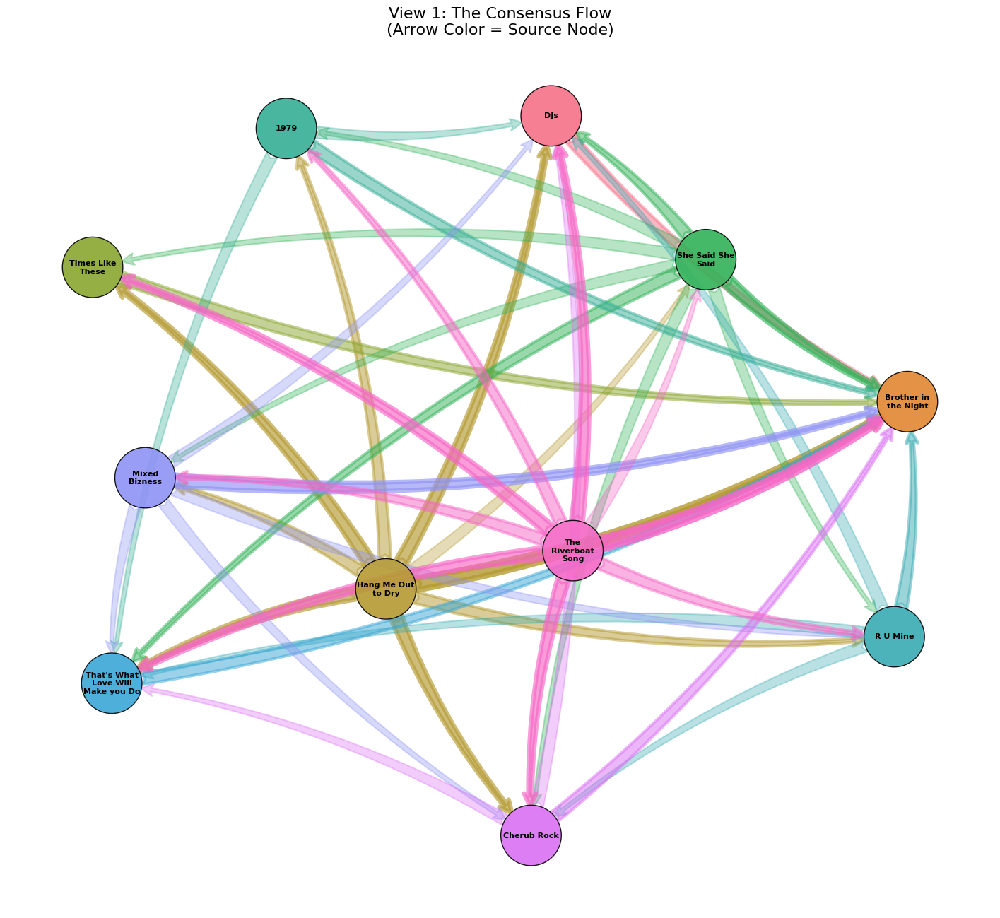

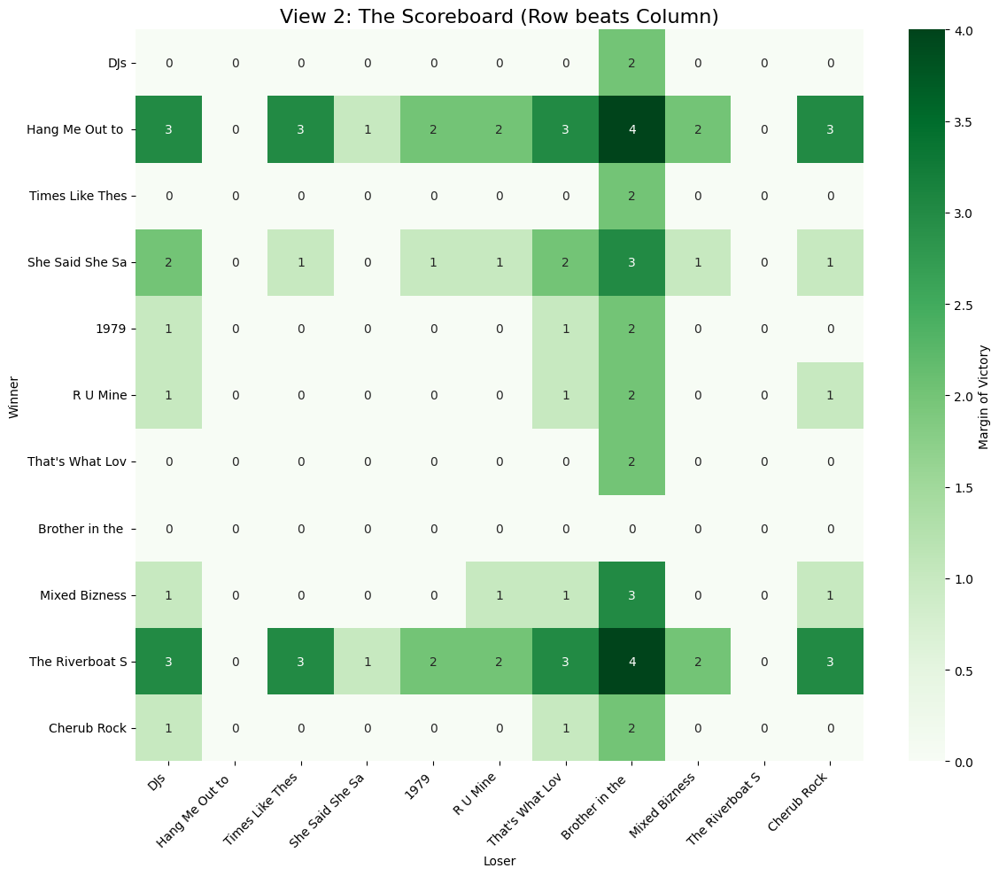

In [52]:
url = "https://docs.google.com/spreadsheets/d/1au1YIATIwzbpWvObDw8SbRwMjkNgFb3vf_ITU_2lRV4/edit?gid=529961457#gid=529961457"

generate_setlist(url)

Fetching data from Sheet ID: 1au1YIATIwzbpWvObDw8SbRwMjkNgFb3vf_ITU_2lRV4...
Analyzing votes from: ['Unnamed: 1', 'Stace', 'Clare', 'Mickey', 'Neil', 'Yes plus 1/2 point for "Maybe"']

THE FINAL SETLIST (Top 16)
1. Last Nite - The Strokes
2. The Distance - Cake
3. Hundred Mile High City - Ocean Colour Scene
4. Sex on Fire - Kings of Leon
5. Mountain Song - Jane's Addiction
6. Stop - Jane's Addiction
7. Misirlou - Dick Dale
8. The Riverboat Song - Ocean Colour Scene
9. Hey Dude - Kula Shaker
10. Idiots Rule - Jane's Addiction
11. Read My Mind - The Killers
12. Little Dolls - Ozzy Osbourne
13. Comfort Eagle - Cake
14. Loud Bark - Mannequin Pussy
15. Dress - PJ Harvey
16. White Men In Black Suits - Everclear


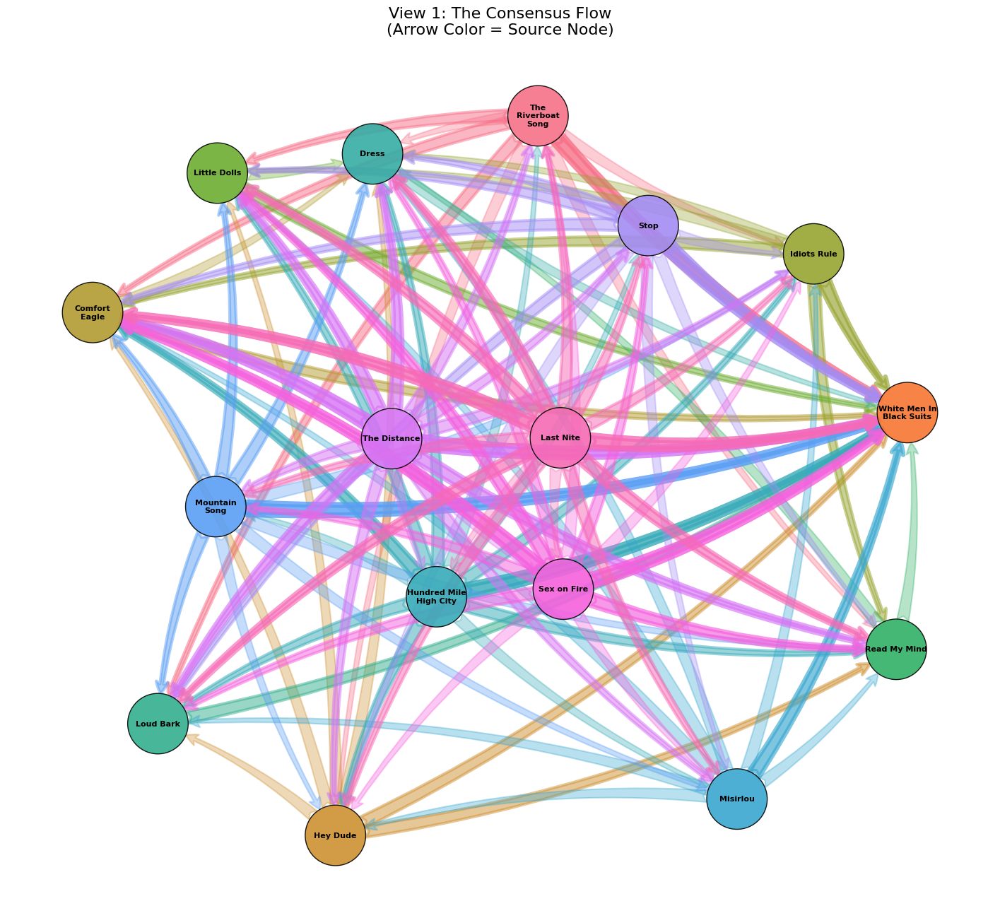

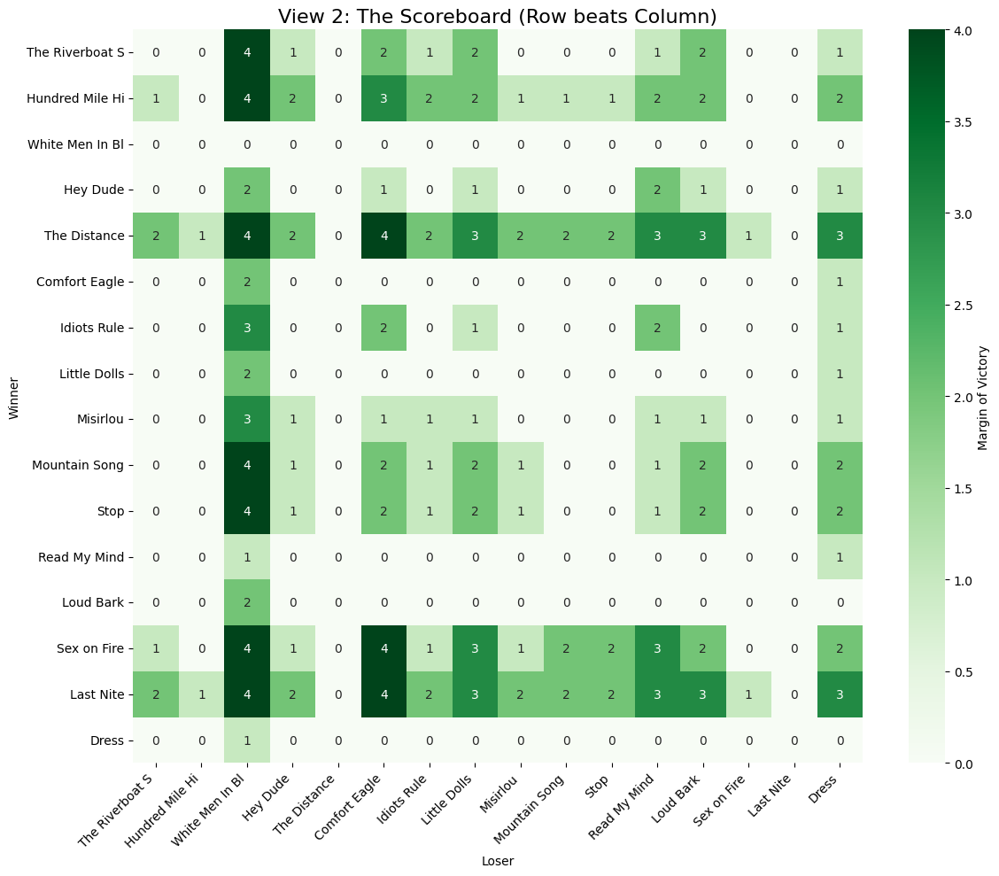

In [54]:
url = "https://docs.google.com/spreadsheets/d/1au1YIATIwzbpWvObDw8SbRwMjkNgFb3vf_ITU_2lRV4/edit?gid=176925738#gid=176925738"

generate_setlist(url)

Fetching data from Sheet ID: 1au1YIATIwzbpWvObDw8SbRwMjkNgFb3vf_ITU_2lRV4...
Analyzing votes from: ['Unnamed: 1', 'Stace', 'Monica', 'Clare', 'Mickey', 'Neil', 'Yes plus 1/2 point for "Maybe"']

THE FINAL SETLIST (Top 10)
1. Ty Segall - Every 1's a Winner
2. Dinosaur Jr. - Feel the Pain
3. Little Feat - Spanish Moon
4. Hop Along - Sister Cities
5. Raging Slab - Weatherman
6. Sonic Youth - Incinerate
7. The Wannadies - You And Me Song
8. The Distillers - City of Angels
9. The Edgar Winter Group - Free Ride
10. Paul McCartney and Wings - Let Me Roll It
Graph saved to 'hierarchy_tmp.png'


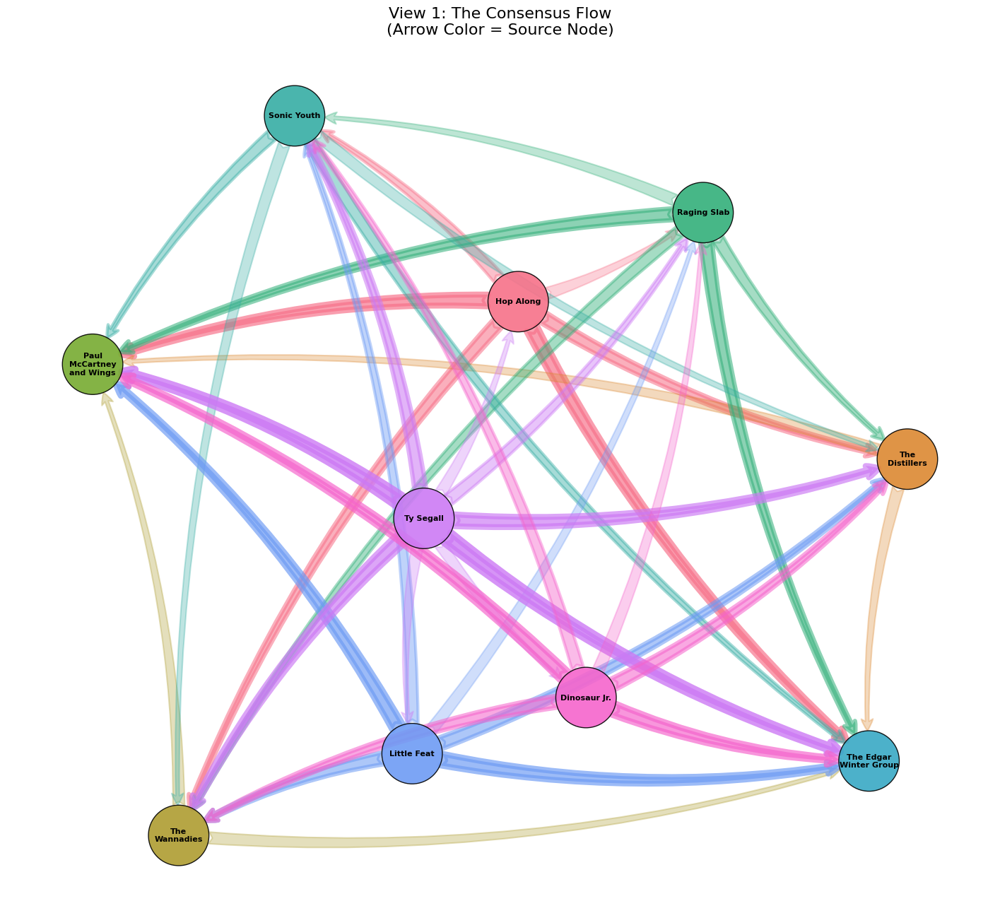

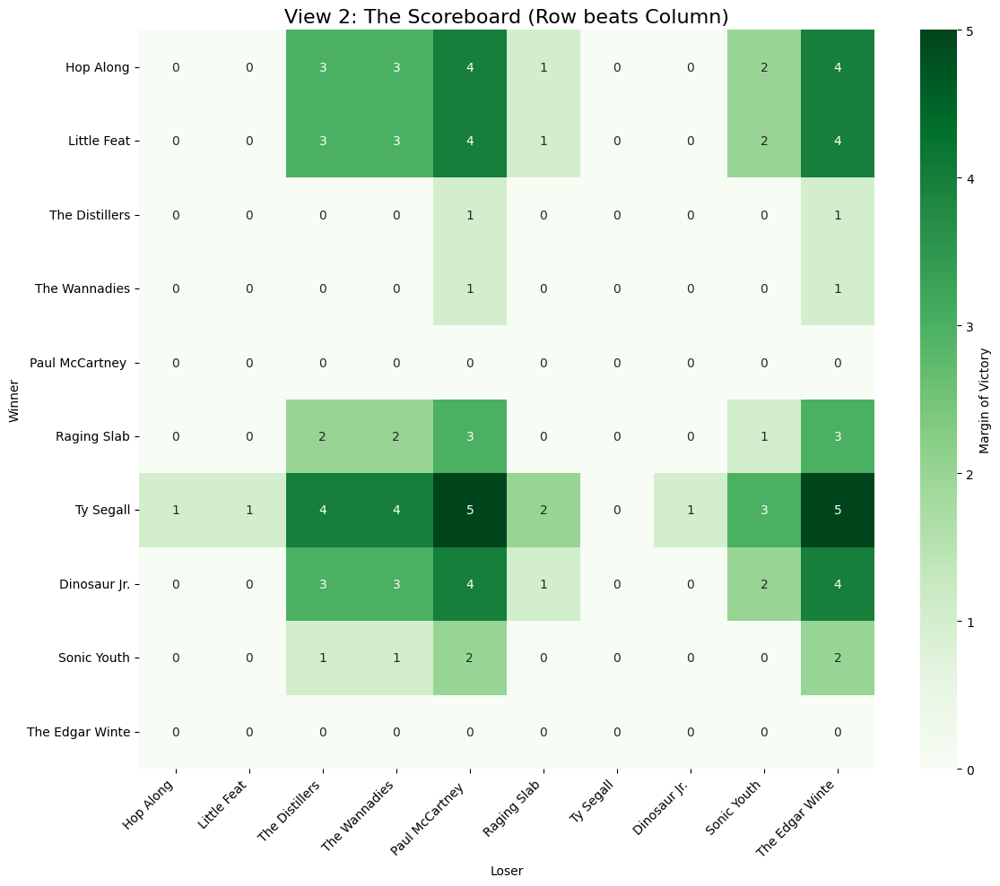

In [60]:
url = "https://docs.google.com/spreadsheets/d/1au1YIATIwzbpWvObDw8SbRwMjkNgFb3vf_ITU_2lRV4/edit?gid=1444141287#gid=1444141287"

generate_setlist(url)

In [71]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import re
import textwrap

# ==========================================
# 1. HELPER FUNCTIONS
# ==========================================

def load_google_sheet(sheet_url):
    """Parses URL and fetches CSV from Google Sheets."""
    id_match = re.search(r'/d/([a-zA-Z0-9-_]+)', sheet_url)
    if not id_match: raise ValueError("Invalid Google Sheets URL.")
    sheet_id = id_match.group(1)
    
    gid_match = re.search(r'gid=([0-9]+)', sheet_url)
    gid = gid_match.group(1) if gid_match else '0'
    
    print(f"Fetching data from Sheet ID: {sheet_id}...")
    return pd.read_csv(f'https://docs.google.com/spreadsheets/d/{sheet_id}/export?format=csv&gid={gid}')

def clean_band_data(df):
    """
    HARDCODED CLEANER:
    - Song Names = Column A (Index 0)
    - Voters     = Columns C-G (Indices 2,3,4,5,6)
    """
    clean = df.copy()
    
    # 1. STOP at first blank row (Standard safety)
    if clean.iloc[:, 0].isnull().any():
        clean = clean.loc[:clean.iloc[:, 0].isnull().idxmax()-1]
    
    # 2. HARDCODED COLUMN SELECTION
    # We explicitly grab the columns by integer index (0=A, 1=B, 2=C...)
    
    # A. Song Name is Column A (Index 0)
    clean['Song_Display'] = clean.iloc[:, 0].astype(str)

    # B. Voters are Columns C through G (Indices 2, 3, 4, 5, 6)
    # Python slices are "up to but not including", so 2:7 gives 2,3,4,5,6
    voter_df = clean.iloc[:, 2:7] 
    voter_cols = voter_df.columns.tolist()
    
    # 3. UNIVERSAL SCORER
    def smart_score(val):
        s = str(val).strip().lower()
        # Veto keywords
        if s in ['no', 'veto', 'never', '-1', '0']: return -1
        # Try numeric
        try:
            return float(s)
        except ValueError:
            pass
        # Text mapping
        text_map = {'yes': 5, 'must play': 5, 'love it': 5, 'good': 4,
                    'maybe': 3, 'okay': 3, 'neutral': 3, 'meh': 2, 'weak': 2}
        return text_map.get(s, 0)

    # Apply scoring only to the selected voter columns
    for col in voter_cols:
        clean[col] = clean[col].apply(smart_score)
        
    # 4. VETO LOGIC
    # Drop song if ANYONE in the hardcoded group scored it -1
    clean = clean[~clean[voter_cols].isin([-1]).any(axis=1)]
    
    return clean, voter_cols

def solve_schulze(df, voter_cols):
    songs = df['Song_Display'].tolist()
    n = len(songs)
    votes = df[voter_cols].values 
    d, p = np.zeros((n, n)), np.zeros((n, n))
    
    for i in range(n):
        for j in range(n):
            if i != j:
                d[i, j] = np.sum(votes[i] > votes[j]) - np.sum(votes[j] > votes[i])

    for i in range(n):
        for j in range(n):
            if i != j and d[i, j] > d[j, i]: p[i, j] = d[i, j]

    for k in range(n):
        for i in range(n):
            for j in range(n):
                if i != j and i != k and j != k:
                    p[i, j] = max(p[i, j], min(p[i, k], p[k, j]))
    return songs, p

def print_setlist(songs, p_matrix):
    n = len(songs)
    wins = np.zeros(n)
    for i in range(n):
        for j in range(n):
            if i != j and p_matrix[i, j] > p_matrix[j, i]: wins[i] += 1
    
    ranked_indices = np.argsort(wins)[::-1]
    print("\n" + "="*40 + f"\nTHE FINAL SETLIST (Top {len(songs)})\n" + "="*40)
    for rank, idx in enumerate(ranked_indices):
        print(f"{rank+1}. {songs[idx]}")
    return ranked_indices

def visualize_network(songs, p_matrix):
    G = nx.DiGraph()
    n = len(songs)
    max_w = np.max(p_matrix) if np.max(p_matrix) > 0 else 1
    
    def smart_label(name):
        if '-' in name: name = name.split('-')[0].strip()
        return "\n".join(textwrap.wrap(name, width=12))

    for i in range(n):
        for j in range(n):
            if i != j and p_matrix[i, j] > p_matrix[j, i]:
                G.add_edge(smart_label(songs[i]), smart_label(songs[j]), weight=p_matrix[i, j])

    plt.figure(figsize=(18, 16))
    pos = nx.spring_layout(G, k=6, iterations=100, seed=42) 
    
    palette = sns.color_palette("husl", len(G.nodes()))
    color_map = {node: palette[i] for i, node in enumerate(G.nodes())}
    node_colors = [color_map[n] for n in G.nodes()]

    nx.draw_networkx_nodes(G, pos, node_size=3800, node_color=node_colors, edgecolors='black', alpha=0.9)
    nx.draw_networkx_labels(G, pos, font_size=8, font_weight='bold', font_color='black')
    
    edges = G.edges()
    if len(edges) > 0:
        weights = [G[u][v]['weight'] for u,v in edges]
        edge_colors = [color_map[u] for u,v in edges]
        alphas = [(w / max_w)*0.6 + 0.2 for w in weights]
        
        for i, (u, v) in enumerate(edges):
            nx.draw_networkx_edges(
                G, pos, edgelist=[(u, v)], width=weights[i] * 1.5,
                edge_color=[edge_colors[i]], alpha=alphas[i],
                arrowstyle='fancy', arrowsize=30, connectionstyle='arc3,rad=0.1', node_size=3800
            )

    plt.title("View 1: The Consensus Flow", fontsize=16)
    plt.axis('off')
    
    # SAVE FILE
    plt.savefig("hierarchy_tmp.png", dpi=300, bbox_inches='tight')
    print("Graph saved to 'hierarchy_tmp.png'")
    
    plt.show()

def visualize_matrix(songs, p_matrix):
    n = len(songs)
    short_names = [s.split('-')[0].strip()[:15] for s in songs]
    display_matrix = np.zeros((n, n))
    for i in range(n):
        for j in range(n):
            if i != j and p_matrix[i, j] > p_matrix[j, i]:
                display_matrix[i, j] = p_matrix[i, j]

    plt.figure(figsize=(12, 10))
    sns.heatmap(display_matrix, xticklabels=short_names, yticklabels=short_names,
                annot=True, fmt='g', cmap='Greens', cbar_kws={'label': 'Margin'})
    plt.title("View 2: The Scoreboard", fontsize=16)
    plt.xlabel("Loser"); plt.ylabel("Winner"); plt.xticks(rotation=45, ha='right')
    plt.tight_layout(); plt.show()

# ==========================================
# 2. THE MASTER FUNCTION
# ==========================================

def generate_setlist(url):
    try:
        df = load_google_sheet(url)
        clean_df, voters = clean_band_data(df)
        print(f"Analyzing votes from: {voters}") # Expect: Stace, Monica, Clare, Mickey, Neil
        songs, p_matrix = solve_schulze(clean_df, voters)
        print_setlist(songs, p_matrix)
        visualize_network(songs, p_matrix)
        visualize_matrix(songs, p_matrix)
    except Exception as e:
        print(f"Error: {e}")

Fetching data from Sheet ID: 1au1YIATIwzbpWvObDw8SbRwMjkNgFb3vf_ITU_2lRV4...
Analyzing votes from: ['Stace', 'Monica', 'Clare', 'Mickey', 'Neil']

THE FINAL SETLIST (Top 10)
1. Ty Segall - Every 1's a Winner
2. Dinosaur Jr. - Feel the Pain
3. Little Feat - Spanish Moon
4. Hop Along - Sister Cities
5. Raging Slab - Weatherman
6. Sonic Youth - Incinerate
7. The Wannadies - You And Me Song
8. The Distillers - City of Angels
9. The Edgar Winter Group - Free Ride
10. Paul McCartney and Wings - Let Me Roll It
Graph saved to 'hierarchy_tmp.png'


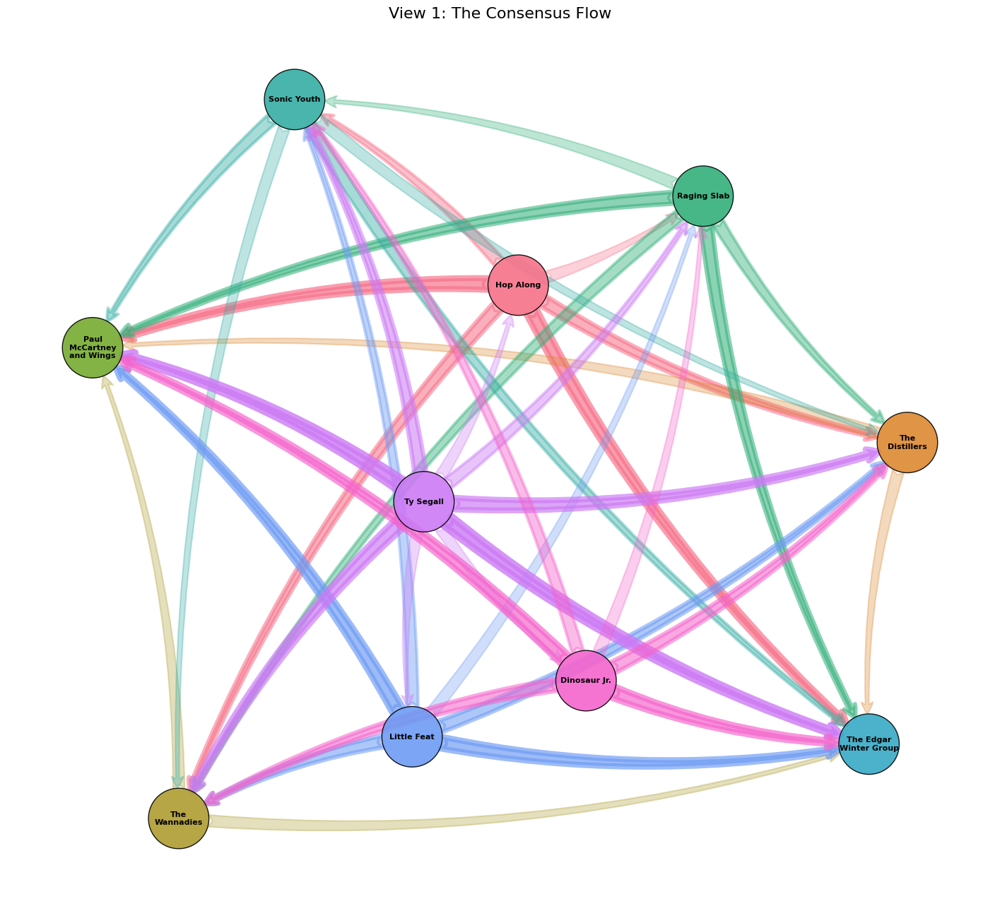

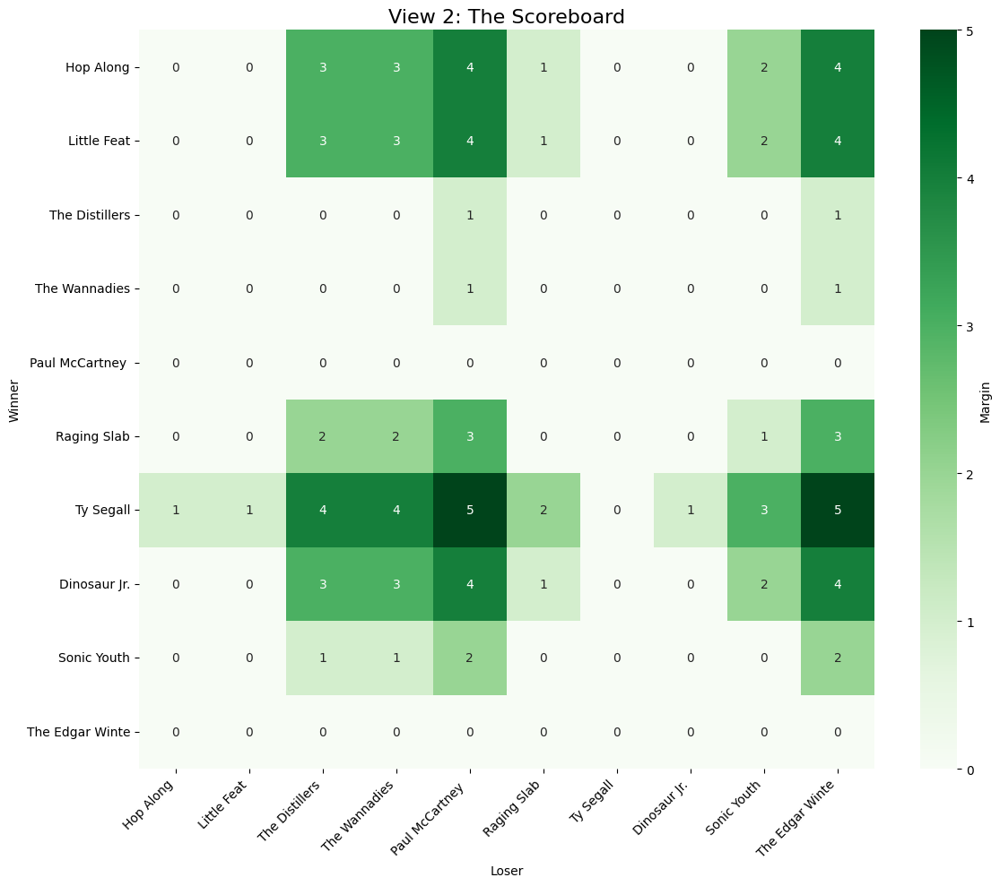

In [72]:
url = "https://docs.google.com/spreadsheets/d/1au1YIATIwzbpWvObDw8SbRwMjkNgFb3vf_ITU_2lRV4/edit?gid=1444141287#gid=1444141287"

generate_setlist(url)

Fetching data from Sheet ID: 1au1YIATIwzbpWvObDw8SbRwMjkNgFb3vf_ITU_2lRV4...
Analyzing votes from: ['Stace', 'Monica', 'Clare', 'Mickey', 'Neil']

THE FINAL SETLIST (Top 13)
1. Oh My God
2. Naive
3. Are You Gonna Go My Way
4. How Long Do I Have to Wait?
5. Black Capricorn Day
6. Only Happy When it Rains
7. Mrs Robinson
8. Desire
9. Moving to New York
10. Dark Nights
11. Lost Art of Keeping a Secret
12. The Denial Twist
13. Thank You
Graph saved to 'hierarchy_tmp.png'


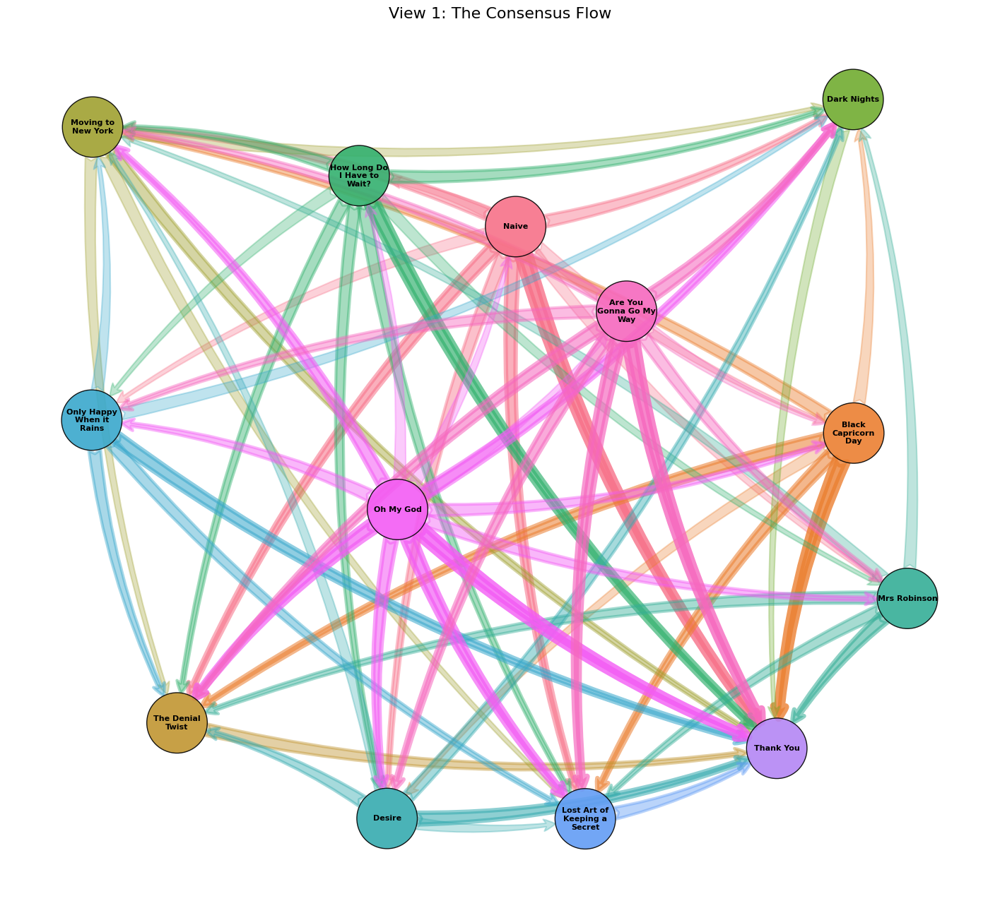

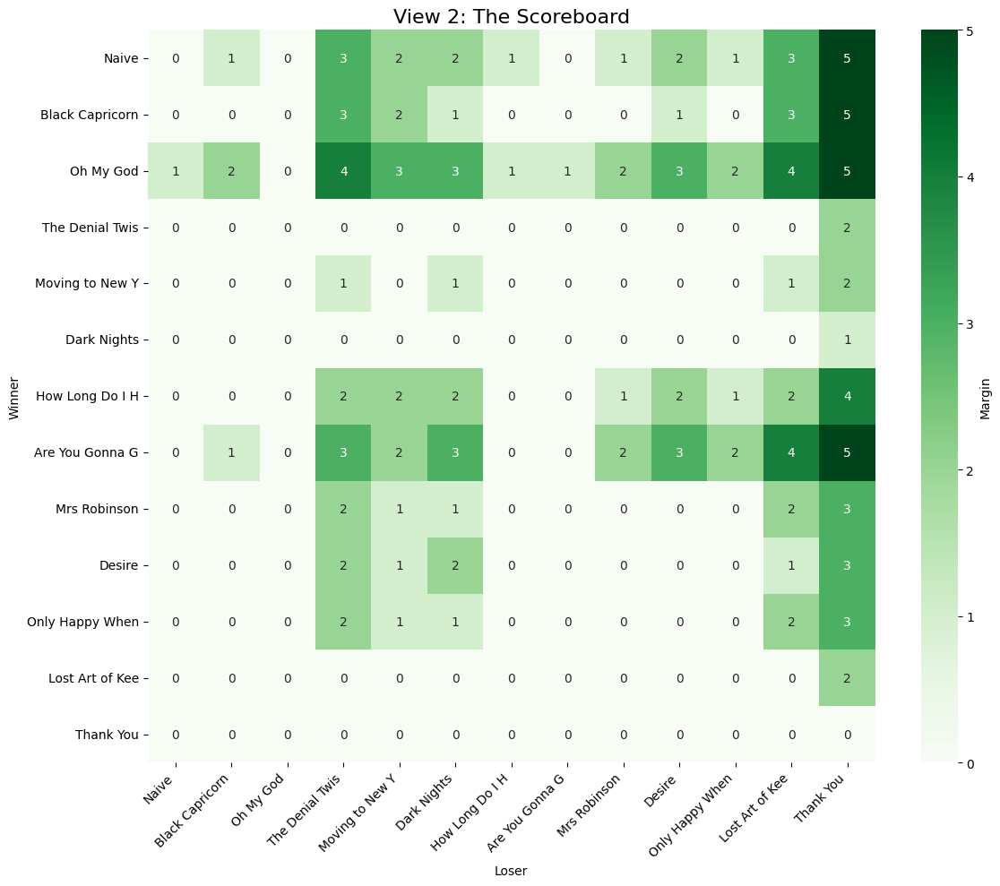

In [73]:
url = "https://docs.google.com/spreadsheets/d/1au1YIATIwzbpWvObDw8SbRwMjkNgFb3vf_ITU_2lRV4/edit?gid=0#gid=0"

generate_setlist(url)

In [89]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import re
import textwrap

# ==========================================
# 1. THE EXACT MAP (6-Point Scale)
# ==========================================
EXACT_SCORES = {
    # --- The New Scale ---
    "⛔ veto": -1,
    "🟡 meh": 2,
    "🔵 okay": 3,
    "🟣 good": 4,
    "🟢 great": 5,
    "🔥 must play": 6,
    
    # --- Variations / Fallbacks ---
    "good": 4, "must play": 6, "great": 5, "meh": 2, "veto": -1,
    
    # --- Silence ---
    "haven't listened": 0, "don't know": 0, "": 0, "nan": 0
}

# ==========================================
# 2. HELPER FUNCTIONS
# ==========================================

def load_google_sheet(sheet_url):
    id_match = re.search(r'/d/([a-zA-Z0-9-_]+)', sheet_url)
    if not id_match: raise ValueError("Invalid Google Sheets URL.")
    sheet_id = id_match.group(1)
    gid_match = re.search(r'gid=([0-9]+)', sheet_url)
    gid = gid_match.group(1) if gid_match else '0'
    print(f"Fetching data from Sheet ID: {sheet_id}...")
    return pd.read_csv(f'https://docs.google.com/spreadsheets/d/{sheet_id}/export?format=csv&gid={gid}')

def clean_band_data(df):
    clean = df.copy()
    
    # --- GOOGLE FORM ROTATION ---
    if 'Timestamp' in clean.columns:
        print("Detected Google Form Format. Rotating data...")
        # Find Voter Name
        id_col = next((c for c in clean.columns if any(x in c.lower() for x in ['name', 'email', 'who', 'voter'])), 'Timestamp')
        print(f"Using '{id_col}' as Voter Name.")
        
        clean = clean.set_index(id_col)
        clean = clean.drop(columns=['Timestamp', 'Score'], errors='ignore')
        clean = clean.transpose()
        clean = clean.reset_index()
        clean.rename(columns={'index': 'Song_Display'}, inplace=True)
        
        # --- FIXED SONG NAME EXTRACTOR ---
        def extract_song_name(s):
            # 1. Remove [Rate ...] brackets from Google Forms
            match = re.search(r'\[(.*?)\]', s)
            text = match.group(1) if match else s
            
            # 2. Split by " - "
            # Format is usually: "Artist - Song" OR "Artist - Song - Remaster"
            parts = text.split(' - ')
            
            # If we have at least 2 parts (Artist & Song), take the 2nd part (Song)
            # This ignores "Part 3" (Remaster info)
            if len(parts) >= 2:
                return parts[1].strip()
                
            # Fallback: If no hyphen, return the whole thing
            return text.strip()

        clean['Song_Display'] = clean['Song_Display'].apply(extract_song_name)
    else:
        # Manual Sheet
        if clean.iloc[:, 0].isnull().any():
            clean = clean.loc[:clean.iloc[:, 0].isnull().idxmax()-1]
        clean['Song_Display'] = clean.iloc[:, 0].astype(str)
        clean = pd.concat([clean[['Song_Display']], clean.iloc[:, 2:]], axis=1)

    # --- LOOKUP ENGINE ---
    voter_cols = [c for c in clean.columns if c != 'Song_Display']
    print(f"Processing {len(voter_cols)} voters: {voter_cols}")

    def apply_map(val):
        s = str(val).strip().lower()
        if s == 'nan' or s == '': return 0
        if s in EXACT_SCORES: return EXACT_SCORES[s]
        raise ValueError(f"\n❌ MATCH ERROR: The vote '{val}' (normalized: '{s}') is not in your EXACT_SCORES dictionary.")

    for col in voter_cols:
        clean[col] = clean[col].apply(apply_map)
        
    clean = clean[~clean[voter_cols].isin([-1]).any(axis=1)]
    return clean, voter_cols

def solve_schulze(df, voter_cols):
    songs = df['Song_Display'].tolist()
    n = len(songs)
    votes = df[voter_cols].values 
    d, p = np.zeros((n, n)), np.zeros((n, n))
    
    for i in range(n):
        for j in range(n):
            if i != j:
                d[i, j] = np.sum(votes[i] > votes[j]) - np.sum(votes[j] > votes[i])
    for i in range(n):
        for j in range(n):
            if i != j and d[i, j] > d[j, i]: p[i, j] = d[i, j]
    for k in range(n):
        for i in range(n):
            for j in range(n):
                if i != j and i != k and j != k:
                    p[i, j] = max(p[i, j], min(p[i, k], p[k, j]))
    return songs, p

def print_setlist(songs, p_matrix, df, voter_cols):
    n = len(songs)
    wins = np.zeros(n)
    for i in range(n):
        for j in range(n):
            if i != j and p_matrix[i, j] > p_matrix[j, i]: wins[i] += 1
            
    # Calculate Average Rating per song for context
    avg_scores = {}
    for i, song in enumerate(songs):
        row = df[df['Song_Display'] == song]
        if not row.empty:
             avg_scores[i] = row[voter_cols].mean(axis=1).values[0]
        else:
             avg_scores[i] = 0

    ranked_indices = np.argsort(wins)[::-1]
    
    print("\n" + "="*50 + f"\nTHE FINAL SETLIST (Top {len(songs)})\n" + "="*50)
    print(f"{'RANK':<5} {'SONG':<30} {'AVG':<6} {'WINS'}")
    print("-" * 50)
    
    for rank, idx in enumerate(ranked_indices):
        print(f"{rank+1:<5} {songs[idx]:<30} {avg_scores[idx]:.1f}   {int(wins[idx])}")
    return ranked_indices

def visualize_network(songs, p_matrix):
    G = nx.DiGraph()
    n = len(songs)
    max_w = np.max(p_matrix) if np.max(p_matrix) > 0 else 1
    def smart_label(name):
        return "\n".join(textwrap.wrap(name, width=12))

    for i in range(n):
        for j in range(n):
            if i != j and p_matrix[i, j] > p_matrix[j, i]:
                G.add_edge(smart_label(songs[i]), smart_label(songs[j]), weight=p_matrix[i, j])

    plt.figure(figsize=(20, 18)) 
    pos = nx.spring_layout(G, k=6, iterations=100, seed=42) 
    palette = sns.color_palette("husl", len(G.nodes()))
    color_map = {node: palette[i] for i, node in enumerate(G.nodes())}
    node_colors = [color_map[n] for n in G.nodes()]

    nx.draw_networkx_nodes(G, pos, node_size=3800, node_color=node_colors, edgecolors='black', alpha=0.9)
    nx.draw_networkx_labels(G, pos, font_size=9, font_weight='bold', font_color='black')
    
    edges = G.edges()
    if len(edges) > 0:
        weights = [G[u][v]['weight'] for u,v in edges]
        edge_colors = [color_map[u] for u,v in edges]
        alphas = [(w / max_w)*0.6 + 0.2 for w in weights]
        for i, (u, v) in enumerate(edges):
            nx.draw_networkx_edges(G, pos, edgelist=[(u, v)], width=weights[i] * 1.5,
                edge_color=[edge_colors[i]], alpha=alphas[i],
                arrowstyle='fancy', arrowsize=30, connectionstyle='arc3,rad=0.1', node_size=3800)

    plt.title("View 1: The Consensus Flow", fontsize=20)
    plt.axis('off')
    filename = "band_hierarchy.png"
    plt.savefig(filename, dpi=300, bbox_inches='tight')
    print(f"Graph saved locally to '{filename}'")
    plt.show()

def visualize_matrix(songs, p_matrix):
    n = len(songs)
    short_names = [s.strip()[:15] for s in songs]
    display_matrix = np.zeros((n, n))
    for i in range(n):
        for j in range(n):
            if i != j and p_matrix[i, j] > p_matrix[j, i]:
                display_matrix[i, j] = p_matrix[i, j]

    plt.figure(figsize=(14, 12))
    sns.heatmap(display_matrix, xticklabels=short_names, yticklabels=short_names,
                annot=True, fmt='g', cmap='Greens', cbar_kws={'label': 'Margin'})
    plt.title("View 2: The Scoreboard", fontsize=16)
    plt.xlabel("Loser"); plt.ylabel("Winner"); plt.xticks(rotation=45, ha='right')
    plt.tight_layout(); plt.show()

# ==========================================
# 3. EXECUTE
# ==========================================
def generate_setlist(url):
    try:
        df = load_google_sheet(url)
        clean_df, voters = clean_band_data(df)
        songs, p_matrix = solve_schulze(clean_df, voters)
        print_setlist(songs, p_matrix, clean_df, voters)
        visualize_network(songs, p_matrix)
        visualize_matrix(songs, p_matrix)
    except Exception as e:
        print(f"Error: {e}")

# Paste your URL here when ready:
# generate_setlist("YOUR_SHEET_URL_HERE")

Fetching data from Sheet ID: 1K7lKxPduUv524YRijjLXDtyZhbfseO18BX-M4EsTmy8...
Detected Google Form Format. Rotating data...
Using 'Fill in your name' as Voter Name.
Processing 2 voters: ['Stace', 'Mickey']

THE FINAL SETLIST (Top 13)
RANK  SONG                           AVG    WINS
--------------------------------------------------
1     Hard Times                     6.0   12
2     Hush                           5.5   8
3     Wild (Premix)                  5.5   8
4     Good Times Bad Times           5.5   8
5     Vehicle                        4.5   6
6     25 or 6 to 4                   4.0   5
7     I.G.Y.                         5.0   5
8     Rikki Don't Lose That Number   4.0   4
9     Elephant                       3.5   4
10    How You Like Me Now            3.0   3
11    Dig A Pony                     2.0   0
12    Rocket                         2.0   0
13    No More No More                2.0   0
Graph saved locally to 'band_hierarchy.png'


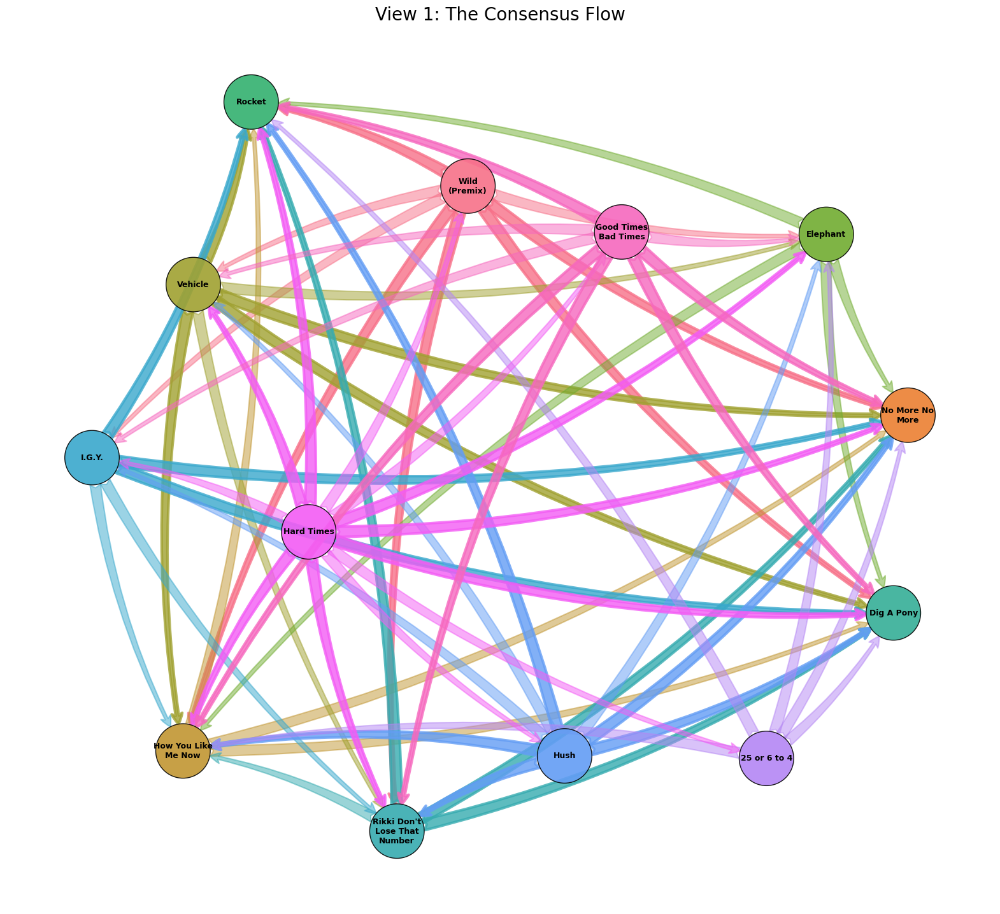

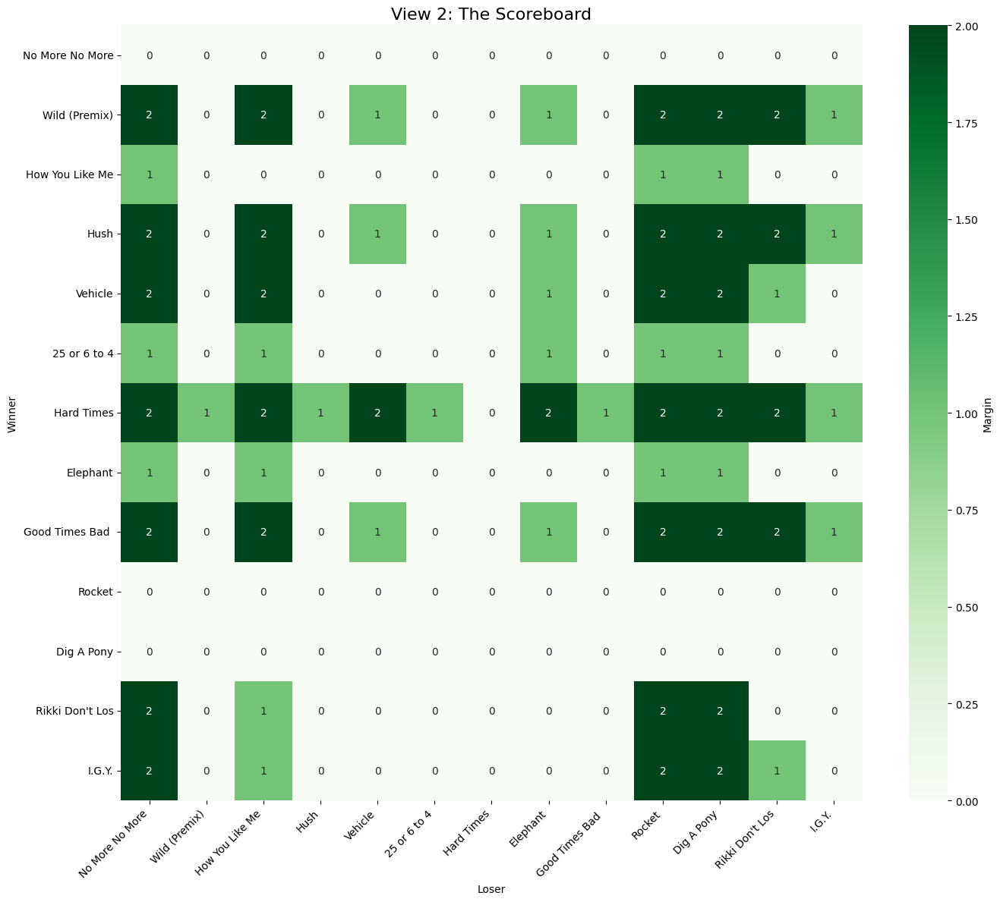

In [91]:
url = "https://docs.google.com/spreadsheets/d/1K7lKxPduUv524YRijjLXDtyZhbfseO18BX-M4EsTmy8/edit?resourcekey=&gid=1757365942#gid=1757365942"
generate_setlist(url)

In [106]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import re
import textwrap
import random

# ==========================================
# 1. THE EXACT MAP (6-Point Scale)
# ==========================================
EXACT_SCORES = {
    "⛔ veto": -1,
    "🟡 meh": 2,
    "🔵 okay": 3,
    "🟣 good": 4,
    "🟢 great": 5,
    "🔥 must play": 6,
    "good": 4, "must play": 6, "great": 5, "meh": 2, "veto": -1,
    "haven't listened": 0, "don't know": 0, "": 0, "nan": 0
}

# ==========================================
# 2. HELPER FUNCTIONS
# ==========================================

def load_google_sheet(sheet_url):
    id_match = re.search(r'/d/([a-zA-Z0-9-_]+)', sheet_url)
    if not id_match: raise ValueError("Invalid Google Sheets URL.")
    sheet_id = id_match.group(1)
    gid_match = re.search(r'gid=([0-9]+)', sheet_url)
    gid = gid_match.group(1) if gid_match else '0'
    print(f"Fetching data from Sheet ID: {sheet_id}...")
    return pd.read_csv(f'https://docs.google.com/spreadsheets/d/{sheet_id}/export?format=csv&gid={gid}')

def clean_band_data(df):
    clean = df.copy()
    
    if 'Timestamp' in clean.columns:
        print("Detected Google Form Format. Rotating data...")
        id_col = next((c for c in clean.columns if any(x in c.lower() for x in ['name', 'email', 'who', 'voter'])), 'Timestamp')
        print(f"Using '{id_col}' as Voter Name.")
        
        clean = clean.set_index(id_col)
        clean = clean.drop(columns=['Timestamp', 'Score'], errors='ignore')
        clean = clean.transpose()
        clean = clean.reset_index()
        clean.rename(columns={'index': 'Song_Display'}, inplace=True)
        
        # --- FIXED SONG NAME EXTRACTOR ---
        def extract_song_name(s):
            match = re.search(r'\[(.*?)\]', s)
            text = match.group(1) if match else s
            parts = text.split(' - ')
            
            # STICKING TO THE 2ND PART: This ensures we get "Rocket" 
            # and not "2011 Remaster"
            if len(parts) >= 2:
                return parts[1].strip()
            return text.strip()

        clean['Song_Display'] = clean['Song_Display'].apply(extract_song_name)
    else:
        if clean.iloc[:, 0].isnull().any():
            clean = clean.loc[:clean.iloc[:, 0].isnull().idxmax()-1]
        clean['Song_Display'] = clean.iloc[:, 0].astype(str)
        clean = pd.concat([clean[['Song_Display']], clean.iloc[:, 2:]], axis=1)

    voter_cols = [c for c in clean.columns if c != 'Song_Display']
    
    def apply_map(val):
        s = str(val).strip().lower()
        if s == 'nan' or s == '': return 0
        if s in EXACT_SCORES: return EXACT_SCORES[s]
        raise ValueError(f"\n❌ MATCH ERROR: The vote '{val}' is not in your dictionary.")

    for col in voter_cols:
        clean[col] = clean[col].apply(apply_map)
        
    clean = clean[~clean[voter_cols].isin([-1]).any(axis=1)]
    return clean, voter_cols

def solve_schulze(df, voter_cols):
    songs = df['Song_Display'].tolist()
    n = len(songs)
    votes = df[voter_cols].values 
    d, p = np.zeros((n, n)), np.zeros((n, n))
    
    for i in range(n):
        for j in range(n):
            if i != j:
                d[i, j] = np.sum(votes[i] > votes[j]) - np.sum(votes[j] > votes[i])
    for i in range(n):
        for j in range(n):
            if i != j and d[i, j] > d[j, i]: p[i, j] = d[i, j]
    for k in range(n):
        for i in range(n):
            for j in range(n):
                if i != j and i != k and j != k:
                    p[i, j] = max(p[i, j], min(p[i, k], p[k, j]))
    return songs, p

def print_setlist(songs, p_matrix, df, voter_cols):
    n = len(songs)
    wins = np.zeros(n)
    for i in range(n):
        for j in range(n):
            if i != j and p_matrix[i, j] > p_matrix[j, i]: wins[i] += 1
            
    avg_scores = {}
    for i, song in enumerate(songs):
        row = df[df['Song_Display'] == song]
        avg_scores[i] = row[voter_cols].mean(axis=1).values[0] if not row.empty else 0

    ranked_indices = np.argsort(wins)[::-1]
    
    print("\n" + "="*55 + f"\nTHE FINAL SETLIST (Top {len(songs)})\n" + "="*55)
    print(f"{'RANK':<5} {'SONG':<35} {'AVG':<6} {'WINS'}")
    print("-" * 55)
    
    for rank, idx in enumerate(ranked_indices):
        print(f"{rank+1:<5} {songs[idx]:<35} {avg_scores[idx]:.1f}   {int(wins[idx])}")
    return ranked_indices

def visualize_network(songs, p_matrix):
    G = nx.DiGraph()
    n = len(songs)
    max_w = np.max(p_matrix) if np.max(p_matrix) > 0 else 1
    def smart_label(name):
        return "\n".join(textwrap.wrap(name, width=12))

    for i in range(n):
        for j in range(n):
            if i != j and p_matrix[i, j] > p_matrix[j, i]:
                G.add_edge(smart_label(songs[i]), smart_label(songs[j]), weight=p_matrix[i, j])

    plt.figure(figsize=(20, 18)) 
    pos = nx.spring_layout(G, k=6, iterations=100, seed=42) 
    
    palettes = ["husl", "Set2", "Pastel1", "tab10", "viridis"]
    chosen_pal = random.choice(palettes)
    palette = sns.color_palette(chosen_pal, len(G.nodes()))
    random.shuffle(palette)
    
    color_map = {node: palette[i] for i, node in enumerate(G.nodes())}
    node_colors = [color_map[n] for n in G.nodes()]

    nx.draw_networkx_nodes(G, pos, node_size=3800, node_color=node_colors, edgecolors='black', alpha=0.9)
    nx.draw_networkx_labels(G, pos, font_size=9, font_weight='bold', font_color='black')
    
    edges = G.edges()
    if len(edges) > 0:
        weights = [G[u][v]['weight'] for u,v in edges]
        edge_colors = [color_map[u] for u,v in edges]
        alphas = [(w / max_w)*0.6 + 0.2 for w in weights]
        for i, (u, v) in enumerate(edges):
            nx.draw_networkx_edges(G, pos, edgelist=[(u, v)], width=weights[i] * 1.5,
                edge_color=[edge_colors[i]], alpha=alphas[i],
                arrowstyle='fancy', arrowsize=30, connectionstyle='arc3,rad=0.1', node_size=3800)

    plt.title(f"View 1: The Consensus Flow (Palette: {chosen_pal})", fontsize=20)
    plt.axis('off')
    plt.show()

def visualize_matrix(songs, p_matrix, df, voter_cols):
    n = len(songs)
    short_names = [s.strip()[:20] for s in songs]
    
    # NEW LOGIC: Calculate raw pairwise wins instead of margins
    display_matrix = np.zeros((n, n))
    votes = df[voter_cols].values
    
    for i in range(n):
        for j in range(n):
            if i != j:
                # Count how many voters actually ranked i > j
                wins_i_over_j = np.sum(votes[i] > votes[j])
                wins_j_over_i = np.sum(votes[j] > votes[i])
                
                # We only display the winner's score to keep the heatmap readable
                if wins_i_over_j > wins_j_over_i:
                    display_matrix[i, j] = wins_i_over_j
                elif wins_i_over_j == wins_j_over_i and i < j:
                    # Optional: handle ties with a tiny value or leave 0
                    display_matrix[i, j] = wins_i_over_j

    plt.figure(figsize=(14, 12))
    themes = ['Greens', 'Blues', 'Purples', 'Oranges', 'Reds', 'YlGnBu', 'BuPu']
    chosen_theme = random.choice(themes)

    sns.heatmap(display_matrix, xticklabels=short_names, yticklabels=short_names,
                annot=True, fmt='g', cmap=chosen_theme, cbar_kws={'label': 'Number of Voters'})
    
    plt.title(f"View 2: Pairwise Wins (Theme: {chosen_theme})", fontsize=16)
    plt.xlabel("Loser"); plt.ylabel("Winner")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout(); plt.show()

# ==========================================
# 3. MASTER EXECUTION
# ==========================================
def generate_setlist(url):
    try:
        df = load_google_sheet(url)
        clean_df, voters = clean_band_data(df)
        songs, p_matrix = solve_schulze(clean_df, voters)
        print_setlist(songs, p_matrix, clean_df, voters)
        visualize_network(songs, p_matrix)
        visualize_matrix(songs, p_matrix)
    except Exception as e:
        print(f"Error: {e}")

# Paste your URL here:
# generate_setlist("YOUR_SHEET_URL_HERE")

Fetching data from Sheet ID: 1K7lKxPduUv524YRijjLXDtyZhbfseO18BX-M4EsTmy8...
Detected Google Form Format. Rotating data...
Using 'Fill in your name' as Voter Name.

THE FINAL SETLIST (Top 13)
RANK  SONG                                AVG    WINS
-------------------------------------------------------
1     Hard Times                          6.0   12
2     25 or 6 to 4                        4.7   10
3     Good Times Bad Times                5.7   10
4     Hush                                5.3   9
5     I.G.Y                               4.7   6
6     Wild (Premix)                       4.3   6
7     Vehicle                             4.3   5
8     Rikki Don't Lose That Number        4.3   5
9     Elephant                            3.7   2
10    Rocket                              3.0   1
11    Dig A Pony                          3.0   1
12    How You Like Me Now                 3.0   1
13    No More No More                     2.3   0


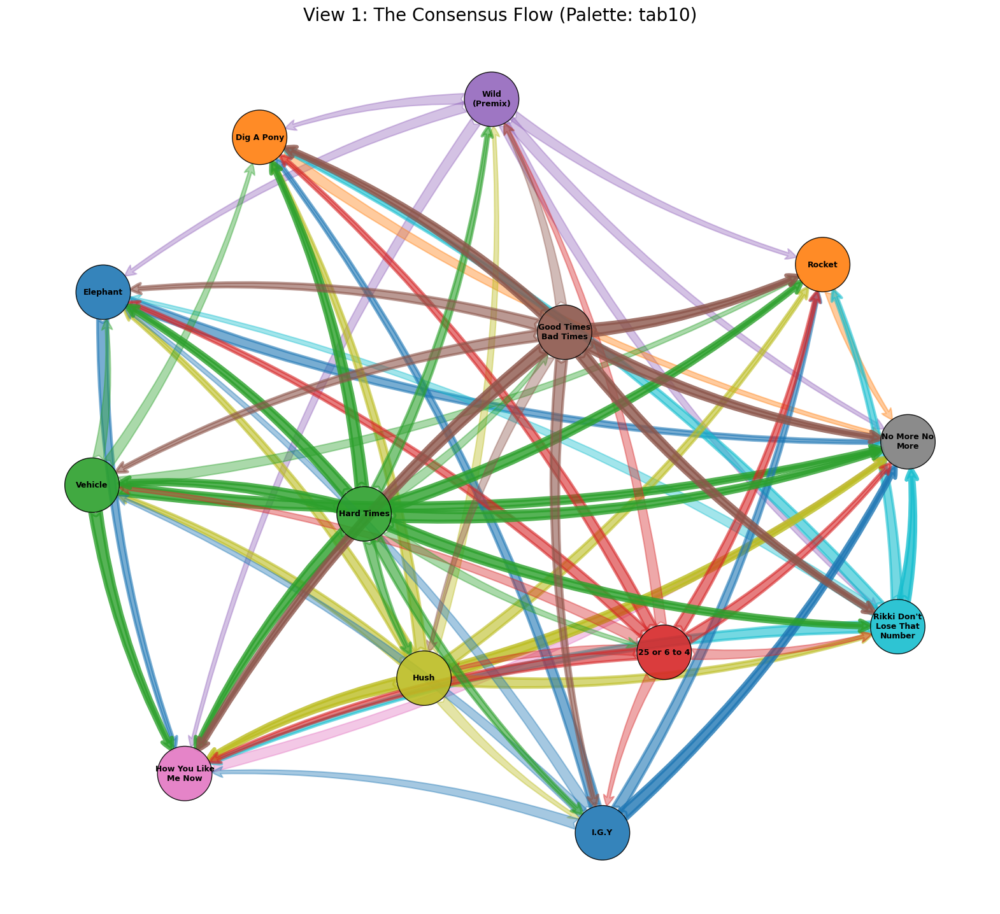

Error: visualize_matrix() missing 2 required positional arguments: 'df' and 'voter_cols'


In [107]:
url = "https://docs.google.com/spreadsheets/d/1K7lKxPduUv524YRijjLXDtyZhbfseO18BX-M4EsTmy8/edit?resourcekey=&gid=1757365942#gid=1757365942"
generate_setlist(url)

In [140]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import re
import textwrap
import random

# ==========================================
# 1. THE EXACT MAP (6-Point Scale)
# ==========================================
EXACT_SCORES = {
    "⛔ veto": -1,
    "🟡 meh": 2,
    "🔵 okay": 3,
    "🟣 good": 4,
    "🟢 great": 5,
    "🔥 must play": 6,
    "good": 4, "must play": 6, "great": 5, "meh": 2, "veto": -1,
    "haven't listened": 0, "don't know": 0, "": 0, "nan": 0
}

# ==========================================
# 2. HELPER FUNCTIONS
# ==========================================

def load_google_sheet(sheet_url):
    id_match = re.search(r'/d/([a-zA-Z0-9-_]+)', sheet_url)
    if not id_match: raise ValueError("Invalid Google Sheets URL.")
    sheet_id = id_match.group(1)
    gid_match = re.search(r'gid=([0-9]+)', sheet_url)
    gid = gid_match.group(1) if gid_match else '0'
    print(f"Fetching data from Sheet ID: {sheet_id}...")
    return pd.read_csv(f'https://docs.google.com/spreadsheets/d/{sheet_id}/export?format=csv&gid={gid}')

def clean_band_data(df):
    clean = df.copy()
    
    if 'Timestamp' in clean.columns:
        print("Detected Google Form Format. Rotating data...")
        id_col = next((c for c in clean.columns if any(x in c.lower() for x in ['name', 'email', 'who', 'voter'])), 'Timestamp')
        
        # --- FIX 1: RESTORED VOTER NAME PRINTOUT ---
        voters_found = clean[id_col].dropna().unique().tolist()
        print(f"\n✅ IDENTIFIED {len(voters_found)} VOTERS: {', '.join(map(str, voters_found))}")
        
        clean = clean.set_index(id_col)
        clean = clean.drop(columns=['Timestamp', 'Score'], errors='ignore')
        clean = clean.transpose()
        clean = clean.reset_index()
        clean.rename(columns={'index': 'Song_Display'}, inplace=True)
        
        def extract_song_name(s):
            match = re.search(r'\[(.*?)\]', s)
            text = match.group(1) if match else s
            parts = text.split(' - ')
            if len(parts) >= 2:
                return parts[1].strip()
            return text.strip()

        clean['Song_Display'] = clean['Song_Display'].apply(extract_song_name)
    else:
        if clean.iloc[:, 0].isnull().any():
            clean = clean.loc[:clean.iloc[:, 0].isnull().idxmax()-1]
        clean['Song_Display'] = clean.iloc[:, 0].astype(str)
        clean = pd.concat([clean[['Song_Display']], clean.iloc[:, 2:]], axis=1)

    voter_cols = [c for c in clean.columns if c != 'Song_Display']
    
    def apply_map(val):
        s = str(val).strip().lower()
        if s == 'nan' or s == '': return 0
        if s in EXACT_SCORES: return EXACT_SCORES[s]
        raise ValueError(f"\n❌ MATCH ERROR: The vote '{val}' is not in your dictionary.")

    for col in voter_cols:
        clean[col] = clean[col].apply(apply_map)
        
    clean = clean[~clean[voter_cols].isin([-1]).any(axis=1)]
    return clean, voter_cols

def solve_schulze(df, voter_cols):
    songs = df['Song_Display'].tolist()
    n = len(songs)
    votes = df[voter_cols].values 
    d, p = np.zeros((n, n)), np.zeros((n, n))
    
    for i in range(n):
        for j in range(n):
            if i != j:
                # Store the margin for the Schulze logic
                d[i, j] = np.sum(votes[i] > votes[j]) - np.sum(votes[j] > votes[i])
    for i in range(n):
        for j in range(n):
            if i != j and d[i, j] > d[j, i]: p[i, j] = d[i, j]
    for k in range(n):
        for i in range(n):
            for j in range(n):
                if i != j and i != k and j != k:
                    p[i, j] = max(p[i, j], min(p[i, k], p[k, j]))
    return songs, p

def print_setlist(songs, p_matrix, df, voter_cols):
    n = len(songs)
    wins = np.zeros(n)
    for i in range(n):
        for j in range(n):
            if i != j and p_matrix[i, j] > p_matrix[j, i]: wins[i] += 1
            
    avg_scores = []
    for i, song in enumerate(songs):
        row = df[df['Song_Display'] == song]
        score = row[voter_cols].mean(axis=1).values[0] if not row.empty else 0
        avg_scores.append(score)

    # --- THE TIE-BREAKER LOGIC ---
    # We create a list of tuples (Wins, Avg, Index)
    # Then sort by Wins descending, then Avg descending
    sort_data = []
    for i in range(n):
        sort_data.append((wins[i], avg_scores[i], i))
    
    # Sort: Primary key is Wins (index 0), Secondary is Avg (index 1)
    # reverse=True puts the highest numbers at the top
    sort_data.sort(key=lambda x: (x[0], x[1]), reverse=True)
    
    print("\n" + "="*55 + f"\nTHE FINAL SETLIST (Top {len(songs)})\n" + "="*55)
    print(f"{'RANK':<5} {'SONG':<35} {'AVG':<6} {'WINS'}")
    print("-" * 55)
    
    for rank, (win_val, avg_val, idx) in enumerate(sort_data):
        print(f"{rank+1:<5} {songs[idx]:<35} {avg_val:.1f}   {int(win_val)}")
    
    # Returning just the song indices in order for any future use
    return [item[2] for item in sort_data]

def visualize_network(songs, p_matrix):
    G = nx.DiGraph()
    n = len(songs)
    max_w = np.max(p_matrix) if np.max(p_matrix) > 0 else 1
    def smart_label(name):
        return "\n".join(textwrap.wrap(name, width=12))

    for i in range(n):
        for j in range(n):
            if i != j and p_matrix[i, j] > p_matrix[j, i]:
                G.add_edge(smart_label(songs[i]), smart_label(songs[j]), weight=p_matrix[i, j])

    plt.figure(figsize=(20, 18)) 
    pos = nx.spring_layout(G, k=6, iterations=100, seed=42) 
    
    palettes = ["husl", "Set2", "deep", "tab10", "tab20c"]
    chosen_pal = random.choice(palettes)
    palette = sns.color_palette(chosen_pal, len(G.nodes()))
    random.shuffle(palette)
    
    color_map = {node: palette[i] for i, node in enumerate(G.nodes())}
    node_colors = [color_map[n] for n in G.nodes()]

    nx.draw_networkx_nodes(G, pos, node_size=3800, node_color=node_colors, edgecolors='black', alpha=0.9)
    nx.draw_networkx_labels(G, pos, font_size=9, font_weight='bold', font_color='black')
    
    edges = G.edges()
    if len(edges) > 0:
        weights = [G[u][v]['weight'] for u,v in edges]
        edge_colors = [color_map[u] for u,v in edges]
        alphas = [(w / max_w)*0.6 + 0.2 for w in weights]
        for i, (u, v) in enumerate(edges):
            nx.draw_networkx_edges(G, pos, edgelist=[(u, v)], width=weights[i] * 1.5,
                edge_color=[edge_colors[i]], alpha=alphas[i],
                arrowstyle='fancy', arrowsize=30, connectionstyle='arc3,rad=0.1', node_size=3800)

    # plt.title(f"View 1: The Consensus Flow (Palette: {chosen_pal})", fontsize=20)

    # SAVE FILE
    plt.savefig("hierarchy_tmp.png", dpi=300, bbox_inches='tight')
    print("Graph saved to 'hierarchy_tmp.png'")
    
    plt.axis('off')
    plt.show()

def visualize_matrix(songs, p_matrix, df, voter_cols):
    n = len(songs)
    short_names = [s.strip()[:20] for s in songs]
    
    # Initialize the matrix with zeros
    display_matrix = np.zeros((n, n))
    votes = df[voter_cols].values
    
    for i in range(n):
        for j in range(n):
            if i != j:
                # 1. Calculate the raw wins for each side
                wins_i_over_j = np.sum(votes[i] > votes[j])
                wins_j_over_i = np.sum(votes[j] > votes[i])
                
                # 2. Calculate the Margin (Net Score)
                # This matches the Schulze 'd' matrix calculation
                margin = wins_i_over_j - wins_j_over_i
                
                # 3. Only record positive margins (Wins)
                # If margin is <= 0 (Loss or Tie), we leave it as 0.
                if margin > 0:
                    display_matrix[i, j] = margin

    # Plotting
    plt.figure(figsize=(14, 12))
    themes = ['Greens', 'Blues', 'Purples', 'Oranges', 'Reds', 'YlGnBu', 'BuPu']
    chosen_theme = random.choice(themes)

    sns.heatmap(display_matrix, 
                xticklabels=short_names, 
                yticklabels=short_names,
                annot=True, 
                fmt='g', 
                cmap=chosen_theme, 
                # Updated label to reflect the data
                cbar_kws={'label': 'Victory Margin (Net Score)'})
    
    plt.title(f"View 2: Pairwise Margins (Theme: {chosen_theme})", fontsize=16)
    plt.xlabel("Loser")
    plt.ylabel("Winner")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# ==========================================
# 3. MASTER EXECUTION
# ==========================================
def generate_setlist(url):
    try:
        df = load_google_sheet(url)
        clean_df, voter_cols = clean_band_data(df)
        songs, p_matrix = solve_schulze(clean_df, voter_cols)
        print_setlist(songs, p_matrix, clean_df, voter_cols)
        visualize_network(songs, p_matrix)
        # Passed clean_df and voter_cols to support the raw win count logic
        visualize_matrix(songs, p_matrix, clean_df, voter_cols)
    except Exception as e:
        print(f"Error: {e}")

Fetching data from Sheet ID: 1K7lKxPduUv524YRijjLXDtyZhbfseO18BX-M4EsTmy8...
Detected Google Form Format. Rotating data...

✅ IDENTIFIED 3 VOTERS: Stace, Mickey, Clare

THE FINAL SETLIST (Top 13)
RANK  SONG                                AVG    WINS
-------------------------------------------------------
1     Hard Times                          6.0   12
2     Good Times Bad Times                5.7   10
3     25 or 6 to 4                        4.7   10
4     Hush                                5.3   9
5     I.G.Y                               4.7   6
6     Wild (Premix)                       4.3   6
7     Vehicle                             4.3   5
8     Rikki Don't Lose That Number        4.3   5
9     Elephant                            3.7   2
10    How You Like Me Now                 3.0   1
11    Rocket                              3.0   1
12    Dig A Pony                          3.0   1
13    No More No More                     2.3   0
Graph saved to 'hierarchy_tmp.png'


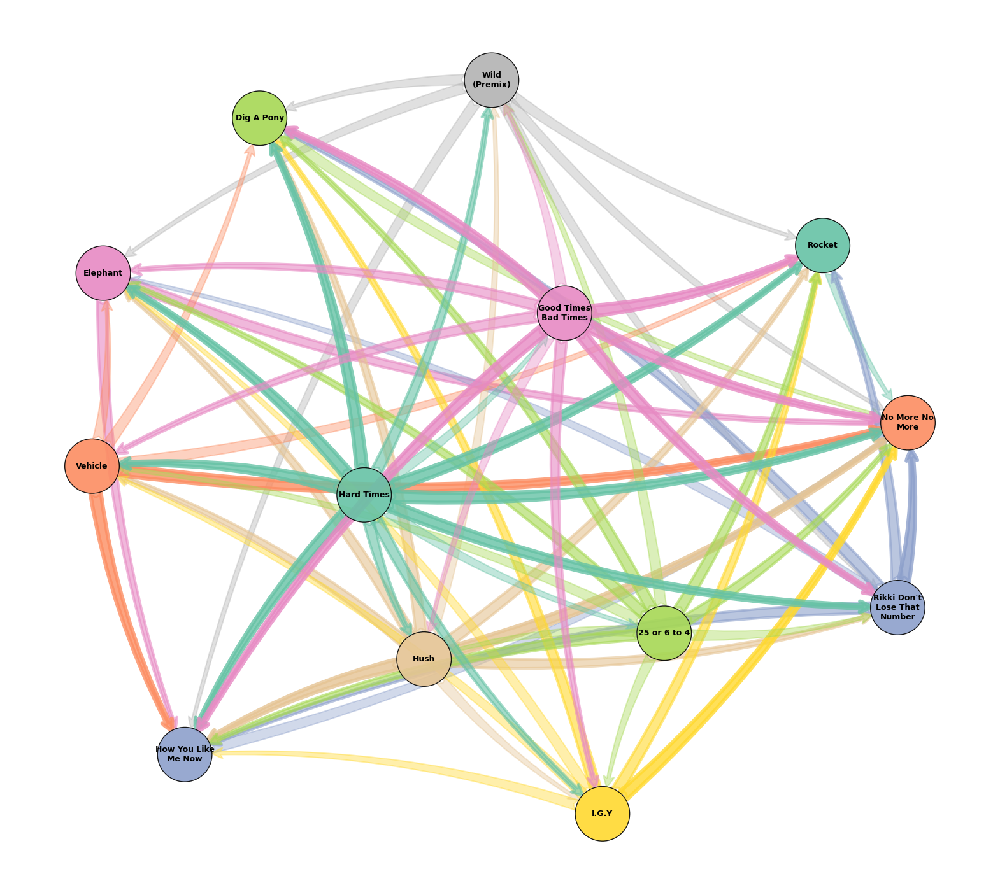

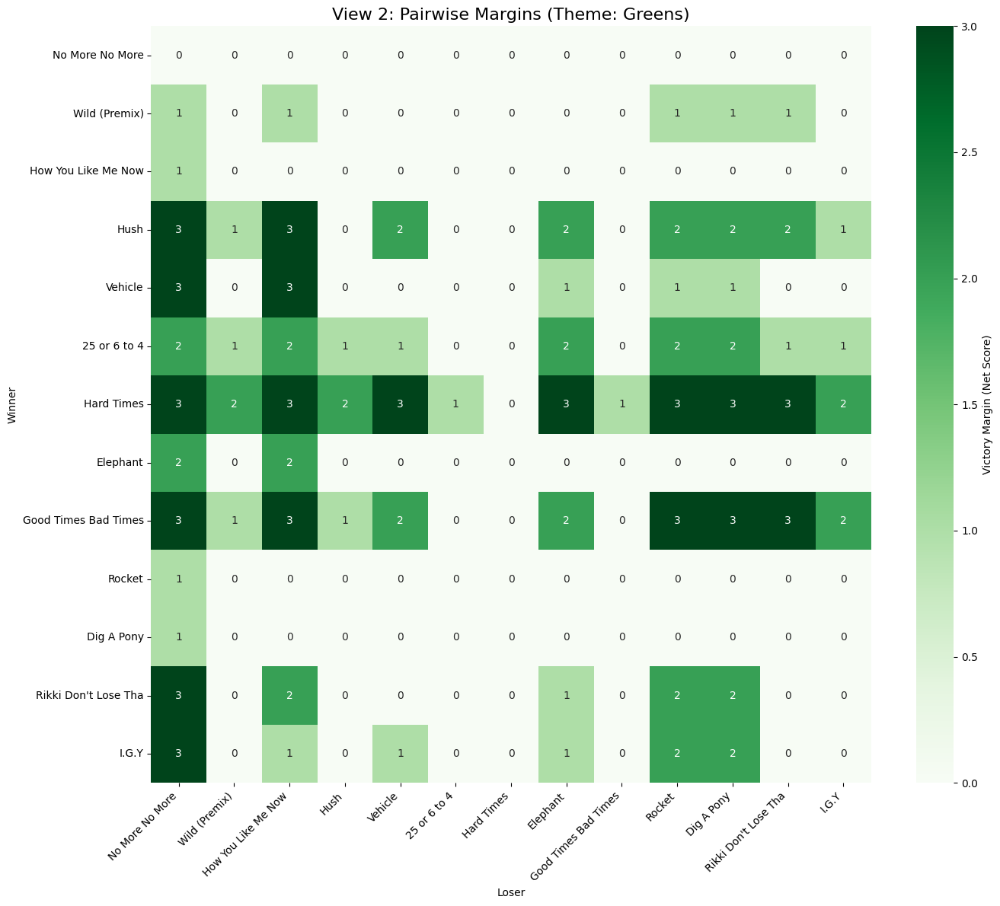

In [141]:
url = "https://docs.google.com/spreadsheets/d/1K7lKxPduUv524YRijjLXDtyZhbfseO18BX-M4EsTmy8/edit?resourcekey=&gid=1757365942#gid=1757365942"
generate_setlist(url)

Fetching data from Sheet ID: 1K7lKxPduUv524YRijjLXDtyZhbfseO18BX-M4EsTmy8...
Detected Google Form Format. Rotating data...

✅ IDENTIFIED 5 VOTERS: Stace, Mickey, Clare, Neil, Monica

THE FINAL SETLIST (Top 12)
RANK  SONG                                AVG    WINS
-------------------------------------------------------
1     Hard Times                          5.6   11
2     Good Times Bad Times                5.4   10
3     25 or 6 to 4                        4.6   9
4     Hush                                5.0   8
5     Elephant                            4.0   5
6     Vehicle                             4.0   4
7     Dig A Pony                          3.8   4
8     Wild (Premix)                       3.8   3
9     How You Like Me Now                 3.8   2
10    Rikki Don't Lose That Number        3.4   2
11    Rocket                              3.2   1
12    No More No More                     2.6   0
Graph saved to 'hierarchy_tmp.png'


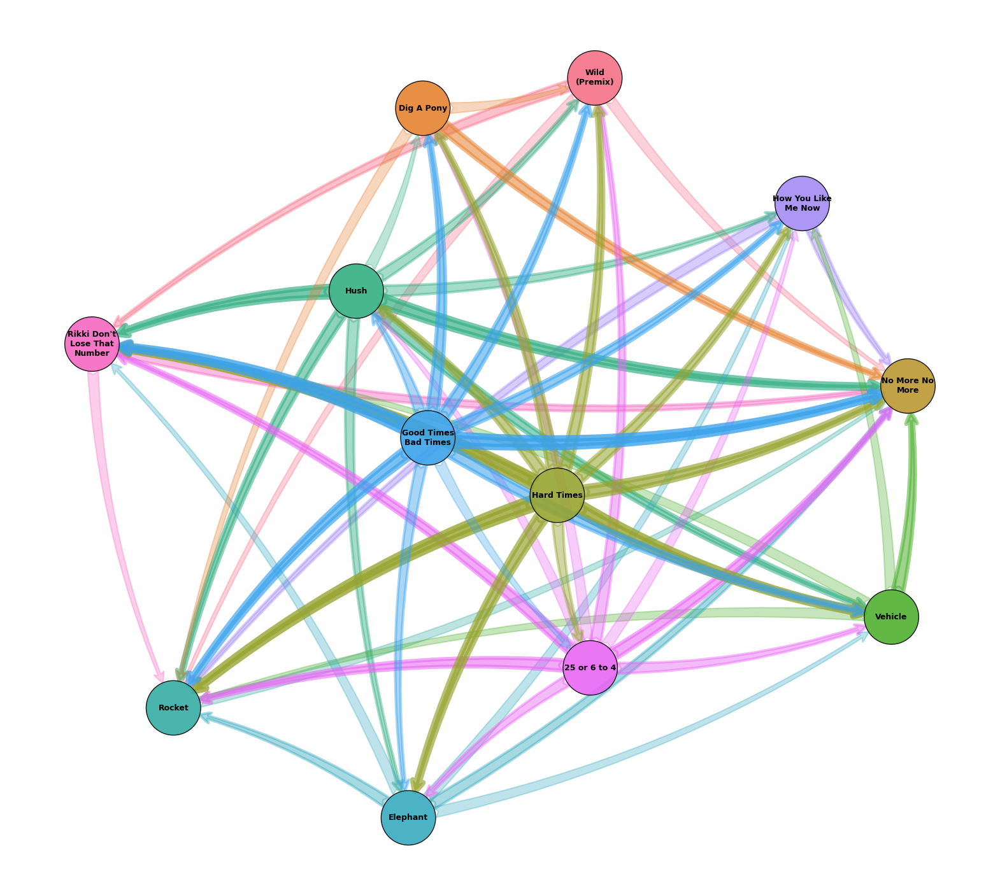

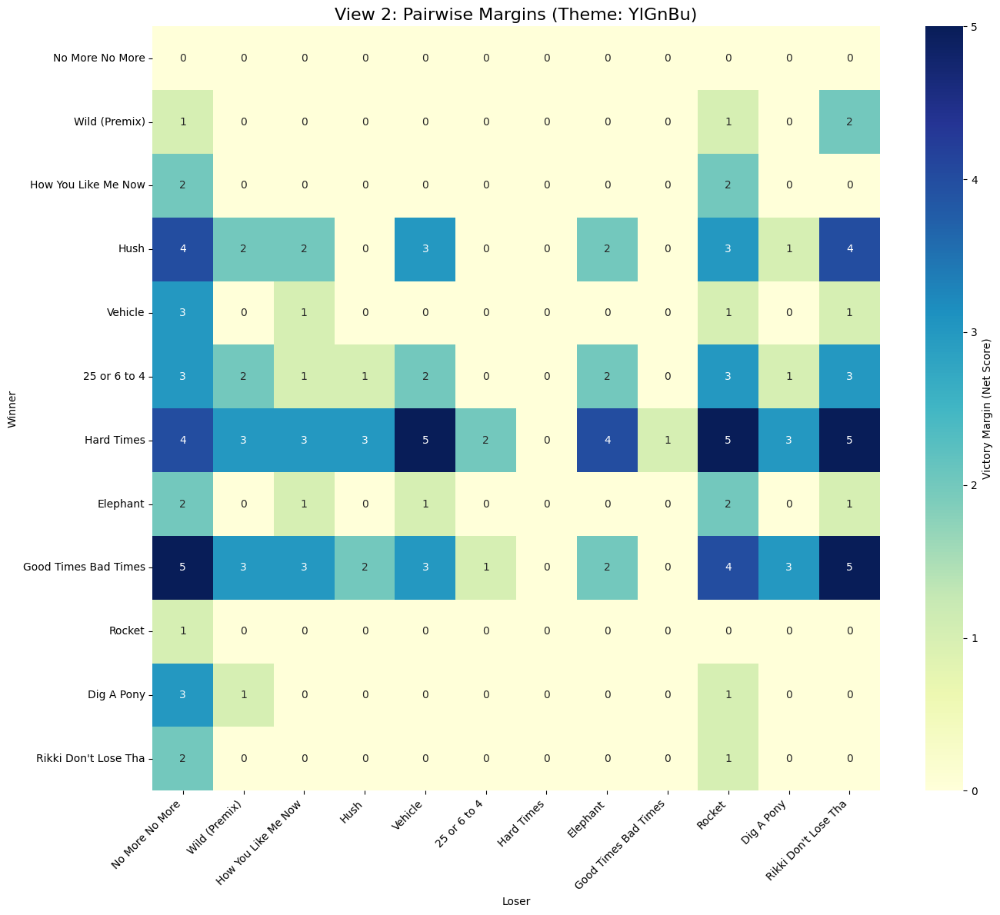


THE MYSTERY SOLVER

🥊 BATTLE ANALYSIS: Elephant vs Vehicle
   Direct Margin (D): 1.0 (Positive = A wins, Negative = B wins)
   Schulze Strength (P): Elephant->Vehicle = 1.0 | Vehicle->Elephant = 0.0
   🗝️ Critical Path: Elephant -> Vehicle


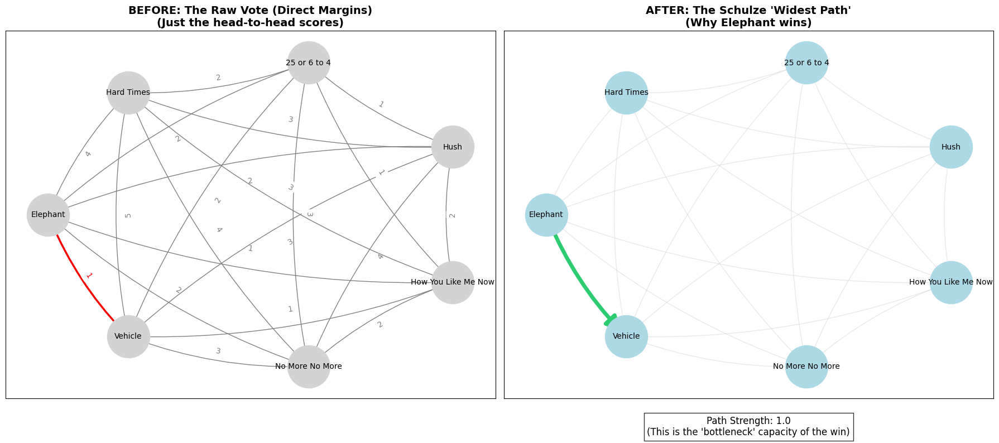

In [150]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
import re
import textwrap
import random

# ==========================================
# 1. THE EXACT MAP (6-Point Scale)
# ==========================================
EXACT_SCORES = {
    "⛔ veto": -1,
    "🟡 meh": 2,
    "🔵 okay": 3,
    "🟣 good": 4,
    "🟢 great": 5,
    "🔥 must play": 6,
    "good": 4, "must play": 6, "great": 5, "meh": 2, "veto": -1,
    "haven't listened": 0, "don't know": 0, "": 0, "nan": 0
}

# ==========================================
# 2. HELPER FUNCTIONS
# ==========================================

def load_google_sheet(sheet_url):
    id_match = re.search(r'/d/([a-zA-Z0-9-_]+)', sheet_url)
    if not id_match: raise ValueError("Invalid Google Sheets URL.")
    sheet_id = id_match.group(1)
    gid_match = re.search(r'gid=([0-9]+)', sheet_url)
    gid = gid_match.group(1) if gid_match else '0'
    print(f"Fetching data from Sheet ID: {sheet_id}...")
    return pd.read_csv(f'https://docs.google.com/spreadsheets/d/{sheet_id}/export?format=csv&gid={gid}')

def clean_band_data(df):
    clean = df.copy()
    
    if 'Timestamp' in clean.columns:
        print("Detected Google Form Format. Rotating data...")
        id_col = next((c for c in clean.columns if any(x in c.lower() for x in ['name', 'email', 'who', 'voter'])), 'Timestamp')
        
        # --- FIX 1: RESTORED VOTER NAME PRINTOUT ---
        voters_found = clean[id_col].dropna().unique().tolist()
        print(f"\n✅ IDENTIFIED {len(voters_found)} VOTERS: {', '.join(map(str, voters_found))}")
        
        clean = clean.set_index(id_col)
        clean = clean.drop(columns=['Timestamp', 'Score'], errors='ignore')
        clean = clean.transpose()
        clean = clean.reset_index()
        clean.rename(columns={'index': 'Song_Display'}, inplace=True)
        
        def extract_song_name(s):
            match = re.search(r'\[(.*?)\]', s)
            text = match.group(1) if match else s
            parts = text.split(' - ')
            if len(parts) >= 2:
                return parts[1].strip()
            return text.strip()

        clean['Song_Display'] = clean['Song_Display'].apply(extract_song_name)
    else:
        if clean.iloc[:, 0].isnull().any():
            clean = clean.loc[:clean.iloc[:, 0].isnull().idxmax()-1]
        clean['Song_Display'] = clean.iloc[:, 0].astype(str)
        clean = pd.concat([clean[['Song_Display']], clean.iloc[:, 2:]], axis=1)

    voter_cols = [c for c in clean.columns if c != 'Song_Display']
    
    def apply_map(val):
        s = str(val).strip().lower()
        if s == 'nan' or s == '': return 0
        if s in EXACT_SCORES: return EXACT_SCORES[s]
        raise ValueError(f"\n❌ MATCH ERROR: The vote '{val}' is not in your dictionary.")

    for col in voter_cols:
        clean[col] = clean[col].apply(apply_map)
        
    clean = clean[~clean[voter_cols].isin([-1]).any(axis=1)]
    return clean, voter_cols

def solve_schulze(df, voter_cols):
    songs = df['Song_Display'].tolist()
    n = len(songs)
    votes = df[voter_cols].values 
    d, p = np.zeros((n, n)), np.zeros((n, n))
    
    for i in range(n):
        for j in range(n):
            if i != j:
                # Store the margin for the Schulze logic
                d[i, j] = np.sum(votes[i] > votes[j]) - np.sum(votes[j] > votes[i])
    for i in range(n):
        for j in range(n):
            if i != j and d[i, j] > d[j, i]: p[i, j] = d[i, j]
    for k in range(n):
        for i in range(n):
            for j in range(n):
                if i != j and i != k and j != k:
                    p[i, j] = max(p[i, j], min(p[i, k], p[k, j]))
    
    # MODIFIED: Returning 'd' (direct margins) as well so we can trace wins
    return songs, p, d

import networkx as nx
import matplotlib.pyplot as plt
import numpy as np
import textwrap

def visualize_head_to_head(song_a, song_b, songs, d_matrix, p_matrix):
    """
    Visualizes the specific battle between two songs to explain the ranking.
    It plots the 'Raw Direct Margins' vs the 'Schulze Widest Path'.
    """
    
    # 1. Get Indices
    try:
        idx_a = [i for i, s in enumerate(songs) if song_a.lower() in s.lower()][0]
        idx_b = [i for i, s in enumerate(songs) if song_b.lower() in s.lower()][0]
        name_a = songs[idx_a]
        name_b = songs[idx_b]
    except IndexError:
        print(f"❌ Error: Could not find '{song_a}' or '{song_b}' in the song list.")
        return

    # 2. Determine who beat whom in the Schulze (P) matrix
    strength_a_b = p_matrix[idx_a, idx_b]
    strength_b_a = p_matrix[idx_b, idx_a]
    
    if strength_a_b > strength_b_a:
        winner, loser = idx_a, idx_b
        win_strength = strength_a_b
        title_res = f"{name_a} defeats {name_b}"
    elif strength_b_a > strength_a_b:
        winner, loser = idx_b, idx_a
        win_strength = strength_b_a
        title_res = f"{name_b} defeats {name_a}"
    else:
        winner, loser = idx_a, idx_b # Default
        win_strength = strength_a_b
        title_res = f"{name_a} ties {name_b}"

    print(f"\n🥊 BATTLE ANALYSIS: {name_a} vs {name_b}")
    print(f"   Direct Margin (D): {d_matrix[idx_a, idx_b]} (Positive = A wins, Negative = B wins)")
    print(f"   Schulze Strength (P): {name_a}->{name_b} = {strength_a_b} | {name_b}->{name_a} = {strength_b_a}")

    # 3. Helper to find the "Widest Path" (The Schulze Path)
    # We want to find the sequence of nodes where min(edge) == p_matrix[winner, loser]
    def find_widest_path(start, end, target_strength, current_path, visited):
        if start == end:
            return current_path
        
        visited.add(start)
        # Sort neighbors by strength descending to find the best path first
        # We look at D matrix because P is built from D
        potential_nodes = []
        for i in range(len(songs)):
            if i not in visited and d_matrix[start, i] >= target_strength:
                potential_nodes.append(i)
        
        # Heuristic sort: prioritize nodes that have strong connection to end
        potential_nodes.sort(key=lambda x: d_matrix[x, end], reverse=True)

        for next_node in potential_nodes:
            res = find_widest_path(next_node, end, target_strength, current_path + [next_node], visited.copy())
            if res: return res
        return None

    path_indices = find_widest_path(winner, loser, win_strength, [winner], set())
    
    if not path_indices:
        # Fallback if logic misses (direct edge usually)
        path_indices = [winner, loser]

    path_names = [songs[i] for i in path_indices]
    print(f"   🗝️ Critical Path: {' -> '.join(path_names)}")

    # ==========================================
    # 4. PLOTTING
    # ==========================================
    fig, axes = plt.subplots(1, 2, figsize=(18, 8))
    
    # Define layout based on the path (Winner top left, Loser bottom right)
    subgraph_nodes = list(path_indices)
    
    # Add a few context nodes (rivals they both fought) to make the graph look 'networky'
    # but don't overcrowd.
    for i in range(len(songs)):
        if i not in subgraph_nodes:
            # Add if connected to both winner and loser
            if d_matrix[winner, i] != 0 and d_matrix[i, loser] != 0:
                subgraph_nodes.append(i)
                if len(subgraph_nodes) > 6: break # Limit size

    G = nx.DiGraph()
    for i in subgraph_nodes:
        G.add_node(songs[i])
    
    # Positional layout - fixed for both graphs
    pos = nx.shell_layout(G)
    
    # --- LEFT PLOT: RAW VOTES (D Matrix) ---
    ax1 = axes[0]
    ax1.set_title(f"BEFORE: The Raw Vote (Direct Margins)\n(Just the head-to-head scores)", fontsize=14, fontweight='bold')
    
    # Draw all raw edges between these nodes
    for i in subgraph_nodes:
        for j in subgraph_nodes:
            if i != j and d_matrix[i, j] > 0:
                weight = d_matrix[i, j]
                # Highlight the specific direct edge if it exists
                color = 'red' if (i == winner and j == loser) else 'gray'
                width = 2.5 if (i == winner and j == loser) else 1
                
                nx.draw_networkx_edges(G, pos, edgelist=[(songs[i], songs[j])], 
                                     width=width, edge_color=color, ax=ax1, 
                                     connectionstyle='arc3,rad=0.1', arrowsize=20)
                # Label edges with raw margin
                nx.draw_networkx_edge_labels(G, pos, edge_labels={(songs[i], songs[j]): int(weight)}, 
                                             ax=ax1, font_color=color)

    nx.draw_networkx_nodes(G, pos, node_color='lightgray', node_size=3000, ax=ax1)
    nx.draw_networkx_labels(G, pos, font_size=10, ax=ax1)
    
    # --- RIGHT PLOT: SCHULZE PATH (P Matrix context) ---
    ax2 = axes[1]
    ax2.set_title(f"AFTER: The Schulze 'Widest Path'\n(Why {songs[winner]} wins)", fontsize=14, fontweight='bold')
    
    nx.draw_networkx_nodes(G, pos, node_color='lightblue', node_size=3000, ax=ax2)
    nx.draw_networkx_labels(G, pos, font_size=10, ax=ax2)
    
    # Draw the Critical Path HIGHLY emphasized
    path_edges = list(zip(path_names, path_names[1:]))
    nx.draw_networkx_edges(G, pos, edgelist=path_edges, width=5, edge_color='#2ecc71', 
                           arrowsize=40, ax=ax2, connectionstyle='arc3,rad=0.1')
    
    # Draw other faint edges for context
    for i in subgraph_nodes:
        for j in subgraph_nodes:
            if i != j and d_matrix[i, j] > 0:
                u, v = songs[i], songs[j]
                if (u, v) not in path_edges:
                    nx.draw_networkx_edges(G, pos, edgelist=[(u, v)], width=1, 
                                         edge_color='lightgray', alpha=0.5, ax=ax2, 
                                         connectionstyle='arc3,rad=0.1')

    # Annotate the Strength
    ax2.text(0.5, -0.1, f"Path Strength: {win_strength}\n(This is the 'bottleneck' capacity of the win)", 
             ha='center', transform=ax2.transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.8))

    plt.tight_layout()
    plt.show()

# ==========================================
# HOW TO USE IT:
# ==========================================
# Call this at the end of your generate_setlist function
# visualize_head_to_head("Elephant", "Vehicle", songs, d_matrix, p_matrix)

def print_setlist(songs, p_matrix, df, voter_cols):
    n = len(songs)
    wins = np.zeros(n)
    for i in range(n):
        for j in range(n):
            if i != j and p_matrix[i, j] > p_matrix[j, i]: wins[i] += 1
            
    avg_scores = []
    for i, song in enumerate(songs):
        row = df[df['Song_Display'] == song]
        score = row[voter_cols].mean(axis=1).values[0] if not row.empty else 0
        avg_scores.append(score)

    # --- THE TIE-BREAKER LOGIC ---
    # We create a list of tuples (Wins, Avg, Index)
    # Then sort by Wins descending, then Avg descending
    sort_data = []
    for i in range(n):
        sort_data.append((wins[i], avg_scores[i], i))
    
    # Sort: Primary key is Wins (index 0), Secondary is Avg (index 1)
    # reverse=True puts the highest numbers at the top
    sort_data.sort(key=lambda x: (x[0], x[1]), reverse=True)
    
    print("\n" + "="*55 + f"\nTHE FINAL SETLIST (Top {len(songs)})\n" + "="*55)
    print(f"{'RANK':<5} {'SONG':<35} {'AVG':<6} {'WINS'}")
    print("-" * 55)
    
    for rank, (win_val, avg_val, idx) in enumerate(sort_data):
        print(f"{rank+1:<5} {songs[idx]:<35} {avg_val:.1f}   {int(win_val)}")
    
    # Returning just the song indices in order for any future use
    return [item[2] for item in sort_data]

def visualize_network(songs, p_matrix, d_matrix):
    # MODIFIED: Takes d_matrix now to draw direct wins only
    G = nx.DiGraph()
    n = len(songs)
    max_w = np.max(d_matrix) if np.max(d_matrix) > 0 else 1
    def smart_label(name):
        return "\n".join(textwrap.wrap(name, width=12))

    for i in range(n):
        for j in range(n):
            # Only draw edges for DIRECT positive margins (d_matrix)
            if i != j and d_matrix[i, j] > 0:
                G.add_edge(smart_label(songs[i]), smart_label(songs[j]), weight=d_matrix[i, j])

    plt.figure(figsize=(20, 18)) 
    pos = nx.spring_layout(G, k=6, iterations=100, seed=42) 
    
    palettes = ["husl", "Set2", "deep", "tab10", "tab20c"]
    chosen_pal = random.choice(palettes)
    palette = sns.color_palette(chosen_pal, len(G.nodes()))
    random.shuffle(palette)
    
    color_map = {node: palette[i] for i, node in enumerate(G.nodes())}
    node_colors = [color_map[n] for n in G.nodes()]

    nx.draw_networkx_nodes(G, pos, node_size=3800, node_color=node_colors, edgecolors='black', alpha=0.9)
    nx.draw_networkx_labels(G, pos, font_size=9, font_weight='bold', font_color='black')
    
    edges = G.edges()
    if len(edges) > 0:
        weights = [G[u][v]['weight'] for u,v in edges]
        edge_colors = [color_map[u] for u,v in edges]
        alphas = [(w / max_w)*0.6 + 0.2 for w in weights]
        for i, (u, v) in enumerate(edges):
            nx.draw_networkx_edges(G, pos, edgelist=[(u, v)], width=weights[i] * 1.5,
                edge_color=[edge_colors[i]], alpha=alphas[i],
                arrowstyle='fancy', arrowsize=30, connectionstyle='arc3,rad=0.1', node_size=3800)

    # plt.title(f"View 1: Direct Wins (Palette: {chosen_pal})", fontsize=20)

    # SAVE FILE
    plt.savefig("hierarchy_tmp.png", dpi=300, bbox_inches='tight')
    print("Graph saved to 'hierarchy_tmp.png'")
    
    plt.axis('off')
    plt.show()

def visualize_matrix(songs, p_matrix, df, voter_cols):
    n = len(songs)
    short_names = [s.strip()[:20] for s in songs]
    
    # Initialize the matrix with zeros
    display_matrix = np.zeros((n, n))
    votes = df[voter_cols].values
    
    for i in range(n):
        for j in range(n):
            if i != j:
                # 1. Calculate the raw wins for each side
                wins_i_over_j = np.sum(votes[i] > votes[j])
                wins_j_over_i = np.sum(votes[j] > votes[i])
                
                # 2. Calculate the Margin (Net Score)
                # This matches the Schulze 'd' matrix calculation
                margin = wins_i_over_j - wins_j_over_i
                
                # 3. Only record positive margins (Wins)
                # If margin is <= 0 (Loss or Tie), we leave it as 0.
                if margin > 0:
                    display_matrix[i, j] = margin

    # Plotting
    plt.figure(figsize=(14, 12))
    themes = ['Greens', 'Blues', 'Purples', 'Oranges', 'Reds', 'YlGnBu', 'BuPu']
    chosen_theme = random.choice(themes)

    sns.heatmap(display_matrix, 
                xticklabels=short_names, 
                yticklabels=short_names,
                annot=True, 
                fmt='g', 
                cmap=chosen_theme, 
                # Updated label to reflect the data
                cbar_kws={'label': 'Victory Margin (Net Score)'})
    
    plt.title(f"View 2: Pairwise Margins (Theme: {chosen_theme})", fontsize=16)
    plt.xlabel("Loser")
    plt.ylabel("Winner")
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# ==========================================
# 3. MASTER EXECUTION
# ==========================================
def generate_setlist(url):
    try:
        df = load_google_sheet(url)
        clean_df, voter_cols = clean_band_data(df)
        
        # MODIFIED: Unpack 3 values now (d_matrix included)
        songs, p_matrix, d_matrix = solve_schulze(clean_df, voter_cols)
        
        print_setlist(songs, p_matrix, clean_df, voter_cols)
        
        # MODIFIED: Pass d_matrix to visualizer for clearer graph
        visualize_network(songs, p_matrix, d_matrix)
        
        visualize_matrix(songs, p_matrix, clean_df, voter_cols)
        
        # --- NEW: Run the Detective Mode ---
        print("\n" + "="*55)
        print("THE MYSTERY SOLVER")
        print("="*55)
        # Check specifically why Elephant beat Vehicle
        visualize_head_to_head("Elephant", "Vehicle", songs, d_matrix, p_matrix)
        
    except Exception as e:
        print(f"Error: {e}")
        import traceback
        traceback.print_exc()

url = "https://docs.google.com/spreadsheets/d/1K7lKxPduUv524YRijjLXDtyZhbfseO18BX-M4EsTmy8/edit?resourcekey=&gid=1757365942#gid=1757365942"
generate_setlist(url)